# Тестовое задание для стажера (Python ML) на прогнозирование

**Цель: Разработать модель для прогнозирования стоимости квартиры с учетом параметров квартиры и выполнения евроремонта.**

**Данные:**
- `flats.xlsx` - данные о квартирах без евроремонта за квадратный метр 
- `euro_renovation.xlsx` - данные о квартирах с евроремонтом за квадратный метр

**Задачи:**
- Разработать модель машинного обучения для прогноза стоимости квартир flats.xlsx, если в них выполнят евроремонт на основании данных квартир с евроремонтом euro_renovation.xlsx
- Валидация модели и оценка точности на тестовой выборке 
- Подготовка итогового отчета в Jupyter Notebook (Оценка)
- Добавить данные по стоимости квартиры с евроремонтом в flats.xlsx в отдельный столбец


**Оценка:**
- Обоснование выбора и применение ML алгоритмов
- Показать метрики качества модели и их анализ (например, MSE, MAE, R2)
- Структура и стиль Notebook


## Подготовка данных

### Импортируем библиотеки

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
# импорты сторонних библиотек
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import random
import time
from tqdm import tqdm

# импорты модулей текущего проекта
from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    make_scorer,
    r2_score
)

from sklearn.model_selection import (
    train_test_split,
    GridSearchCV,
    RandomizedSearchCV,
    cross_val_score,
    RepeatedKFold
)

from sklearn.preprocessing import (
    OneHotEncoder,
    OrdinalEncoder,
    StandardScaler,
    MinMaxScaler
)

from sklearn.ensemble import RandomForestRegressor
from pandas_profiling import ProfileReport
from sklearn.compose import make_column_transformer
from sklearn.pipeline import make_pipeline

from catboost import Pool, CatBoostRegressor, cv
from lightgbm import LGBMRegressor

import phik
from phik.report import plot_correlation_matrix
from phik import report

In [3]:
#import xlrd
import openpyxl

In [4]:
#pd.reset_option('display.float_format')

In [5]:
pd.set_option('display.max_columns', None)

In [6]:
from numpy.core.umath import deg2rad
import math
import requests
from bs4 import BeautifulSoup
import json

### Считаем данные из файла и сохраним их в переменную

In [7]:
def read_xls(path):
    wookbook = openpyxl.load_workbook(path)
    worksheet = wookbook.active
    
    columns_list = []
    for i in range(1, 2):#worksheet.max_row):
        for col in worksheet.iter_cols(1, worksheet.max_column):
            #print(col[i].value, end="\t\t")
            columns_list.append(col[i].value)
        #print('')
        
    df = pd.DataFrame(columns=columns_list)

    for i in tqdm(range(1, worksheet.max_row)):
    
        row_values = []
        for col in worksheet.iter_cols(1, worksheet.max_column):
            row_values.append(col[i].value)
        
        df.loc[len(df.index)] = row_values
    
    return df[1:]

Раскомментировать следующие 4 ячейки для чтения файла xlsx (загрузка занимает продолжительное время). 

In [8]:
#df_flats = read_xls("flats.xlsx")

In [9]:
#df_euro = read_xls("euro_renovation.xlsx")

In [10]:
# сделаем резервные копии загруженных файлов
#df_reserve_flats = df_flats.copy()
#df_reserve_euro = df_euro.copy()

In [11]:
# сохраним резервные копии в виде файлов csv
#df_reserve_flats.to_csv('optimum_reserve_flats.csv', index=False)
#df_reserve_euro.to_csv('optimum_reserve_euro.csv', index=False)

In [12]:
# считаем файлы в соответсвующие переменные (так формат данных проставится автоматически)
df_flats = pd.read_csv('optimum_reserve_flats.csv', dtype={'id': 'int', 'offer_views': 'int',
                                               'house_floors': 'int',
                                               'lifts': 'int', 'freight_lifts': 'int'})

In [13]:
df_euro = pd.read_csv('optimum_reserve_euro.csv', dtype={'id': 'int', 'offer_views': 'int',
                                               'house_floors': 'int',
                                               'lifts': 'int', 'freight_lifts': 'int'}) 

In [14]:
# склеим данные из двух файлов в один
df = pd.concat([df_flats, df_euro], ignore_index=True )

df_flats[(~df_flats['balconies'].isna())&(df_flats['balconies']!=df_flats['all_data.object_info.loggias'])][['balconies','all_data.object_info.loggias']].head(20) #

### Спарсим данные по координатам метро

In [15]:
def getKoordinates():
    req = requests.get('https://api.hh.ru/metro')    
    data = req.content.decode()
    req.close()
    jsObj = json.loads(data)
    areas = []
    metro_station = {}
    for city in jsObj:
        #print(city['name'])
        for lines in city['lines']:
            #print(lines['name'])
            #print()
            for station in lines['stations']:
                #print(station['name'])
                #print(station)
                #print(station['lat'], station['lng'])
                metro_station[station['name']] = (
        float(station['lat']), # координата широта
        float(station['lng'])  # координата долгота
    )
                
        #print()
        #print()
    return metro_station

metro_station = getKoordinates()

In [16]:
# НЕ ИСПОЛЬЗУЕТСЯ
st_accept = "text/html" # говорим веб-серверу, 
                        # что хотим получить html
# имитируем подключение через браузер Mozilla на macOS
st_useragent = "Mozilla/5.0 (Macintosh; Intel Mac OS X 12_3_1) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/15.4 Safari/605.1.15"
# формируем хеш заголовков
headers = {
   "Accept": st_accept,
   "User-Agent": st_useragent
}

In [17]:
# НЕ ИСПОЛЬЗУЕТСЯ
# отправляем запрос с заголовками по нужному адресу
req = requests.get("http://www.lovrikinfo.ru/metrogps.php", headers)

# считываем текст HTML-документа
src = req.text

# инициализируем html-код страницы 
soup = BeautifulSoup(src, 'lxml')

In [18]:
# НЕ ИСПОЛЬЗУЕТСЯ
# записываем сведения о станции метро и ее координатам в словарь

table = len(soup.find_all('table')[7].find_all('tr'))

moscow_station = {}

for string in soup.find_all('table')[7].find_all('tr')[3:table]: 
    station_name = string.find_all('td')[0].text
    moscow_station[station_name] = (
        float(string.find_all('td')[1].text), # координата широта
        float(string.find_all('td')[2].text)  # координата долгота
    )

### Выведем 10 строк датафрейма

In [19]:
df

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,all_data.house.ceiling_height,all_data.house.has_garbage_disposer,all_data.object_info.living_area,all_data.object_info.loggias,all_data.house.parking[0].display_name,all_data.house.yard[0].display_name,all_data.house.yard[1].display_name,all_data.house.infrastructure[0].display_name,all_data.house.infrastructure[1].display_name,all_data.house.infrastructure[2].display_name,all_data.house.infrastructure[3].display_name,all_data.house.infrastructure[4].display_name,all_data.object_info.garage_type.display_name
0,1914739808,0,Казань,55.752364,49.171021,176510.0,49.0,18.0,12.5,None,0.0,NaN,None,1.0,None,23,Монолитный,1,0,24.0,2022.0,False,0.0,Свободная продажа,2.80,False,20.4,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1915485255,0,Москва,55.734623,37.613548,179404.0,38.6,5.0,0.0,None,0.0,NaN,None,1.0,True,6,Кирпичный,0,0,5.0,1900.0,False,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1914105595,0,Новосибирск,55.059296,82.974436,91863.0,38.1,1.0,12.1,Совмещенный,0.0,Косметический,False,1.0,False,5,Кирпичный,0,0,NaN,1950.0,False,0.0,Свободная продажа,NaN,False,14.5,NaN,Во дворе,Детская площадка,Спортивная площадка,Школа,Детский сад,Торговый центр,Парк,Фитнес,NaN
3,1914234894,0,Новосибирск,55.063730,82.934848,112903.0,31.0,4.0,6.0,Совмещенный,0.0,Косметический,False,1.0,False,5,Кирпичный,0,0,25.0,1964.0,False,0.0,Свободная продажа,2.80,False,18.0,NaN,Во дворе,Детская площадка,Спортивная площадка,Школа,Парк,Детский сад,Фитнес,Торговый центр,NaN
4,1913219306,0,Казань,55.753630,49.246030,167682.0,65.6,2.0,13.8,None,1.0,NaN,False,2.0,True,10,Кирпичный,1,0,NaN,2013.0,False,0.0,NaN,NaN,NaN,NaN,NaN,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8006,1865111487,0,Санкт-Петербург,59.814695,30.344030,206296.0,27.0,13.0,5.0,None,0.0,Евро,False,0.0,False,15,Кирпично-монолитный,1,0,NaN,2019.0,False,0.0,Свободная продажа,NaN,NaN,20.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8007,1834602512,46,Санкт-Петербург,60.040240,30.215571,203200.0,25.0,15.0,0.0,Совмещенный,1.0,Евро,False,0.0,False,17,Монолитный,2,0,NaN,2021.0,False,0.0,Свободная продажа,2.75,False,18.0,NaN,Подземная,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8008,1838378337,0,Санкт-Петербург,59.865506,30.513345,173333.0,30.0,15.0,5.0,Совмещенный,1.0,Евро,False,0.0,None,24,Монолитный,3,0,NaN,2023.0,False,0.0,Переуступка,2.70,False,20.0,NaN,Подземная,Детская площадка,Спортивная площадка,Школа,Детский сад,Торговый центр,Парк,Фитнес,NaN
8009,1840264239,49,Санкт-Петербург,59.892550,30.450202,216000.0,25.0,14.0,0.0,None,0.0,евроремонт,False,0.0,None,17,Монолитный,1,0,36.0,2017.0,False,0.0,Свободная продажа,2.65,NaN,16.5,1.0,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN


In [20]:
# переименуем колонки для удобства
df = df.rename(columns={'all_data.object_info.garage_type.display_name': 'garage_type', 
                        'all_data.house.infrastructure[4].display_name': 'infrastructure_4', 
                        'all_data.house.infrastructure[3].display_name': 'infrastructure_3', 
                        'all_data.house.infrastructure[2].display_name': 'infrastructure_2', 
                        'all_data.house.infrastructure[1].display_name': 'infrastructure_1',
                        'all_data.house.infrastructure[0].display_name': 'infrastructure_0',
                        'all_data.house.yard[1].display_name': 'yard_1',
                        'all_data.house.yard[0].display_name': 'yard_0',
                        'all_data.house.parking[0].display_name': 'parking_0',
                        'all_data.object_info.loggias': 'loggias',
                        'all_data.object_info.living_area': 'living_area',
                        'all_data.house.has_garbage_disposer': 'has_garbage_disposer',
                        'all_data.house.ceiling_height': 'ceiling_height'})

### Выведем основную информацию о датафрейме с помощью метода info()

In [21]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8011 entries, 0 to 8010
Data columns (total 37 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      8011 non-null   int32  
 1   offer_views             8011 non-null   int32  
 2   city                    8011 non-null   object 
 3   lat                     8011 non-null   float64
 4   lon                     8011 non-null   float64
 5   price_sq                8010 non-null   float64
 6   area                    8010 non-null   float64
 7   floor                   8010 non-null   float64
 8   kitchen_area            8011 non-null   float64
 9   bathroom_type           8011 non-null   object 
 10  balconies               8011 non-null   float64
 11  renovation              4919 non-null   object 
 12  is_apartment            8011 non-null   object 
 13  rooms                   8010 non-null   float64
 14  has_gas                 8011 non-null   

### Проверим данные на наличие дубликатов

In [22]:
df.duplicated().sum() #['house_floors', 'house_wall_type', 'build_year','time_on_foot_to_subway']

0

Создадим справку по домам, в которых продается больше 1 квартиры

In [23]:
spravka = df[df[['lat','lon']].duplicated()][['lat','lon','house_floors','house_wall_type','time_on_foot_to_subway','ceiling_height','build_year']].sort_values(by='lon') #.groupby(['lat','lon']).agg({'build_year':'mean'})
spravka.shape

(3752, 7)

In [24]:
spravka.groupby(['lat','lon']).agg({'house_floors':'median',
                                   'time_on_foot_to_subway':'median',
                                   'ceiling_height':'median',
                                   'build_year':'median'}).reset_index()

,lat,lon,house_floors,time_on_foot_to_subway,ceiling_height,build_year
0,54.857248,82.989851,8.0,NaN,NaN,2020.0
1,54.860223,82.978622,5.0,NaN,NaN,1973.0
2,54.862181,82.974993,3.0,NaN,NaN,NaN
3,54.866927,82.972128,18.0,NaN,2.70,2022.0
4,54.928846,82.922262,5.0,NaN,2.50,1971.0
...,...,...,...,...,...,...
1417,60.059194,30.280313,7.0,NaN,NaN,NaN
1418,60.059234,30.277115,25.0,NaN,2.75,2022.0
1419,60.059351,30.281400,24.0,NaN,2.67,2023.0
1420,60.059813,30.280322,25.0,NaN,2.67,2022.0


### Определим количество и процент пропущенных значений для каждого столбца

In [25]:
# количество пропущенных значений для каждого столбца
print(df.isna().sum())

# процент пропущенных значений для каждого столбца
pd.DataFrame(round(df.isna().mean()*100,)).style.background_gradient('coolwarm')

id                           0
offer_views                  0
city                         0
lat                          0
lon                          0
price_sq                     1
area                         1
floor                        1
kitchen_area                 0
bathroom_type                0
balconies                    0
renovation                3092
is_apartment                 0
rooms                        1
has_gas                      0
house_floors                 0
house_wall_type            266
lifts                        0
freight_lifts                0
time_on_foot_to_subway    3568
build_year                 978
urgent                       0
duplicates_count             0
sale_type                 1730
ceiling_height            5339
has_garbage_disposer      3866
living_area               2594
loggias                   6762
parking_0                 5833
yard_0                    4515
yard_1                    5981
infrastructure_0          6268
infrastr

,0
id,0.000000
offer_views,0.000000
city,0.000000
lat,0.000000
lon,0.000000
price_sq,0.000000
area,0.000000
floor,0.000000
kitchen_area,0.000000
bathroom_type,0.000000


В датасете имеется большое количество пропусков. В некоторых столбцах их процент превышает 80% от общего количества записей. 
Рассмотрим каждую колонку в отдельности. Вероятно, некоторые данные удастся восстановить благодаря имеющейся информации. 

### Работа с колонками (пропуски, тип данных, дубли)

#### Первый взгляд на данные

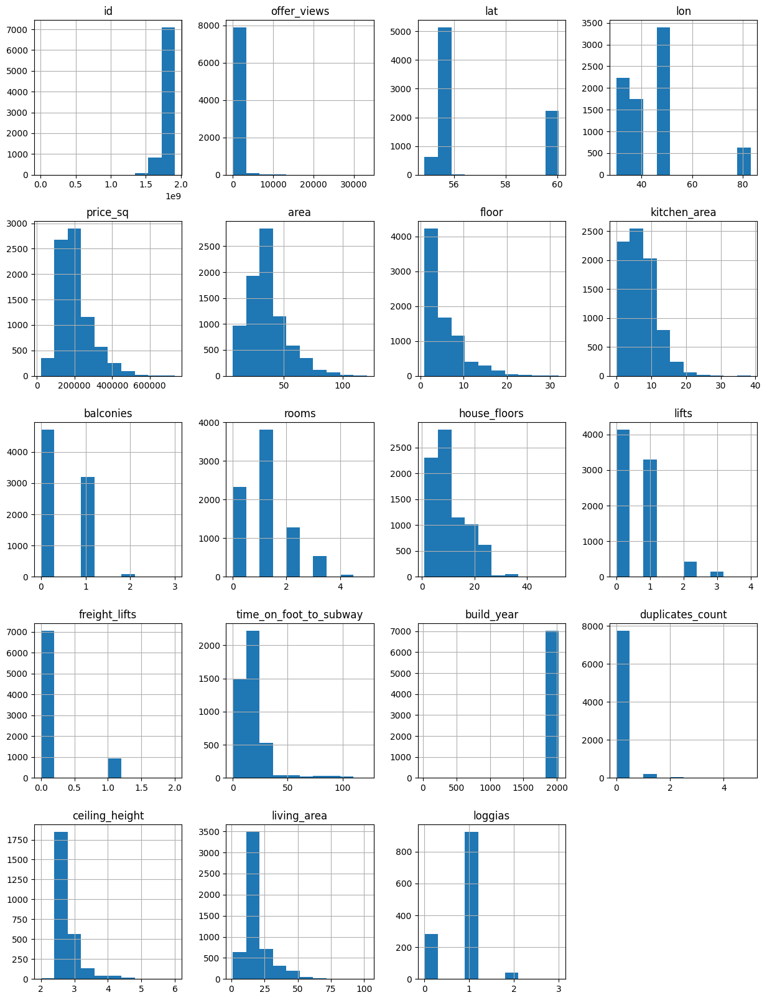

In [26]:
# построим гистрограммы для всех числовых столбцов таблицы
x = df.hist(figsize=(15, 20))
plt.show()

In [27]:
# Посмотрим числовое описание данных
df.describe()

,id,offer_views,lat,lon,price_sq,area,floor,kitchen_area,balconies,rooms,house_floors,lifts,freight_lifts,time_on_foot_to_subway,build_year,duplicates_count,ceiling_height,living_area,loggias
count,8.011000e+03,8011.000000,8011.000000,8011.000000,8010.000000,8010.000000,8010.000000,8011.000000,8011.000000,8010.000000,8011.000000,8011.000000,8011.000000,4443.000000,7033.000000,8011.000000,2672.000000,5417.000000,1249.000000
mean,1.834967e+09,283.312945,56.882351,44.045502,199848.567541,35.298154,5.445069,6.539923,0.423792,1.027466,11.032705,0.575459,0.120210,18.345712,1987.786151,0.040944,2.789356,19.692795,0.810248
std,8.791760e+07,1101.565539,1.920177,13.863967,85559.363699,16.350000,4.445566,4.816243,0.518355,0.888036,6.359255,0.683051,0.329422,14.369622,37.556852,0.251976,0.359588,9.578501,0.480408
min,4.216351e+06,0.000000,54.851464,30.091972,21108.000000,6.500000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,23.000000,0.000000,2.000000,1.000000,0.000000
25%,1.807241e+09,0.000000,55.752708,30.441453,140913.500000,24.000000,2.000000,3.000000,0.000000,0.000000,5.000000,0.000000,0.000000,11.000000,1968.000000,0.000000,2.600000,14.500000,1.000000
50%,1.863524e+09,0.000000,55.812140,48.909943,182370.000000,32.700000,4.000000,6.000000,0.000000,1.000000,9.000000,0.000000,0.000000,16.000000,1983.000000,0.000000,2.700000,17.500000,1.000000
75%,1.895143e+09,162.000000,59.840555,49.187388,240176.250000,43.000000,8.000000,9.500000,1.000000,1.000000,14.000000,1.000000,0.000000,21.000000,2017.000000,0.000000,2.800000,20.800000,1.000000
max,1.916467e+09,33175.000000,60.062759,83.125515,734693.000000,120.600000,32.000000,38.600000,3.000000,5.000000,52.000000,4.000000,2.000000,122.000000,2027.000000,5.000000,6.000000,102.000000,3.000000


In [28]:
# Просмотрим уникальные значения качественных признаков
for col in df.select_dtypes(include='object').columns.to_list():
    print(col)
    print('----------------------------')
    print(df[col].value_counts())
    print()

city
----------------------------
Казань                  3395
Санкт-Петербург         2237
Москва                  1727
Новосибирск              632
поселение Сосенское       13
поселение Мосрентген       4
поселение Московский       3
Name: city, dtype: int64

bathroom_type
----------------------------
None            5976
Совмещенный     1537
Раздельный       490
Более одного       8
Name: bathroom_type, dtype: int64

renovation
----------------------------
Косметический                      1186
Евро                               1104
косметический                       613
Требует ремонта                     474
Дизайнерский                        461
Без ремонта                         388
евроремонт                          211
Отсутствует                         125
Требуется                           121
Хороший                              72
Под чистовой ремонт                  44
С отделкой                           39
Частичный ремонт                     20
чистовая отделк

**Краткий анализ (не завершен)**

**offer_views:** Количество просмотров объявления. В основной массе по нулям. Хотя встречаются записи и до 162, и даже с 33175 просмотрами.

**lat:** Широта местоположения объекта. Меняется от 54.851464 до 60.062759.

**lon:** Долгота местоположения объекта. Меняется от 30.091972 до 83.125515.

**price_sq:** Цена за квадратный метр. Наша целевая переменная. Варьируется от 21108 до 734693 рублей. Медиана - 182370 рублей.

**area:** Площадь объекта. Варьируется от 6.5 до 120.6 кв м. Медиана - 32.7 кв м. То есть чаще всего в объявлениях попадаются однушки и студии.

**floor:** Этаж объекта. Меняется от 1 до 32. Чаще всего продают квартиры со 2 до 8 этажа, а самым популярным оказался 4 этаж.

**kitchen_area:** Площадь кухни. Варьируется от 0 до 38.6 кв м. Но, как правило, лежит в диапазоне от 3 до 9.5 кв м. Самая частовстречаемая площадь кухни 6 кв м. 

**balconies:** Количество балконов. В наших данных встречаются квартиры как без балкона, так и с 3 балконами, но чаще с 1.

**rooms:** Количество комнат.

has_gas                      0
house_floors                 0
house_wall_type            266
lifts                        0
freight_lifts                0
time_on_foot_to_subway    3568
build_year                 978
urgent                       0
duplicates_count             0
sale_type                 1730
ceiling_height            5339
has_garbage_disposer      3866
living_area               2594
loggias                   6762
parking_0                 5833
yard_0                    4515
yard_1                    5981
infrastructure_0          6268
infrastructure_1          6321
infrastructure_2          6516
infrastructure_3          6776
infrastructure_4          7092
garage_type               7662

#### Колонка price_sq

In [29]:
df[df['price_sq'].isna()]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type
5531,1847453890,13,Санкт-Петербург,59.847955,30.193491,NaN,NaN,NaN,0.0,None,0.0,NaN,False,NaN,True,9,Железобетон,0,0,NaN,1981.0,False,0.0,Свободная продажа,2.55,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


В датасете имеется 1 запись об объекте недвижимости, по которой практически нет информации, т.е. с большим количеством пропусков. Удалим ее.

In [30]:
df = df.dropna(subset=['price_sq'])

In [31]:
df[df['price_sq'].isna()]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type


In [32]:
df['price_sq'].describe()

count      8010.000000
mean     199848.567541
std       85559.363699
min       21108.000000
25%      140913.500000
50%      182370.000000
75%      240176.250000
max      734693.000000
Name: price_sq, dtype: float64

#### Колонка build_year

In [33]:
df[df['build_year'].isna()]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type
5,1874814030,0,Казань,55.782522,49.184981,193159.0,44.00,8.0,13.00,None,0.0,NaN,None,1.0,None,20,Монолитный,1,0,NaN,NaN,False,0.0,NaN,NaN,NaN,14.00,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,1911841556,0,Новосибирск,55.012238,83.001242,86153.0,39.00,1.0,2.70,Совмещенный,1.0,Косметический,False,1.0,None,10,Панельный,0,0,57.0,NaN,False,0.0,Свободная продажа,NaN,NaN,25.00,NaN,Во дворе,Детская площадка,Спортивная площадка,Школа,Парк,Детский сад,Фитнес,Торговый центр,NaN
10,1841461609,20,Казань,55.811108,49.073042,217662.0,38.50,8.0,10.10,None,1.0,NaN,False,1.0,None,24,Кирпично-монолитный,0,0,23.0,NaN,False,0.0,Переуступка,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16,1813819959,123,Москва,55.762844,37.679188,401156.0,17.30,1.0,0.00,Совмещенный,0.0,Дизайнерский,True,0.0,False,4,Кирпичный,0,0,14.0,NaN,False,1.0,Свободная продажа,NaN,False,NaN,NaN,Во дворе,NaN,NaN,Школа,Парк,Детский сад,Фитнес,Торговый центр,NaN
23,1700149810,1908,Новосибирск,54.946964,82.972244,73809.0,42.00,3.0,10.54,None,0.0,Требует ремонта,False,1.0,False,10,Панельный,1,0,NaN,NaN,False,0.0,Свободная продажа,NaN,NaN,16.59,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7922,1841002333,57,Санкт-Петербург,59.870041,30.253552,200447.0,24.57,12.0,4.00,None,0.0,Евро,True,0.0,None,12,Кирпично-монолитный,1,0,11.0,NaN,False,0.0,Свободная продажа,NaN,False,16.05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7966,1747606352,206,Санкт-Петербург,59.990683,30.295521,185314.0,28.60,9.0,0.00,Совмещенный,0.0,Евро,True,0.0,None,13,Монолитный,1,1,12.0,NaN,False,0.0,Переуступка,NaN,NaN,NaN,NaN,Подземная,Детская площадка,Спортивная площадка,Школа,Детский сад,Торговый центр,Парк,NaN,NaN
7982,1811262342,124,Санкт-Петербург,60.035962,30.222578,206072.0,24.70,12.0,1.00,None,0.0,евроремонт,False,0.0,None,25,Монолитный,0,0,NaN,NaN,False,0.0,Свободная продажа,NaN,NaN,14.00,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7987,1816806317,80,Санкт-Петербург,60.039589,30.224141,207600.0,25.00,9.0,0.00,None,1.0,евроремонт,False,0.0,None,25,Монолитный,0,0,NaN,NaN,False,0.0,Свободная продажа,NaN,NaN,18.00,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [34]:
# посмотрим числовые характеристики
df['build_year'].describe()

count    7032.000000
mean     1987.787116
std        37.559435
min        23.000000
25%      1968.000000
50%      1983.000000
75%      2017.000000
max      2027.000000
Name: build_year, dtype: float64

Обнаружили запись с годом постройки здания = 23. Исправим ее на 2023

In [35]:
df[df['build_year'] == 23] #['build_year'].hist(bins=100)

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type
3288,1647044203,2210,Москва,55.662273,37.734776,304270.0,28.1,4.0,0.0,Совмещенный,1.0,Дизайнерский,False,0.0,None,25,Монолитный,3,1,18.0,23.0,False,0.0,Переуступка,2.66,NaN,17.1,NaN,Охраняемая,Детская площадка,Спортивная площадка,Школа,Детский сад,Торговый центр,Парк,Фитнес,NaN


In [36]:
df.loc[df['build_year'] == 23, 'build_year'] = 2023

In [37]:
# заполним пропуски на основании известных данных других квартир, продающихся в этом доме
df['build_year'] = df.groupby(['lat','lon'])['build_year'].transform(lambda group: group.fillna(group.median()))

In [38]:
# посмотрим, как изменились числовые характеристики
df['build_year'].describe()

count    7592.000000
mean     1990.186644
std        29.563716
min      1776.000000
25%      1969.000000
50%      1988.000000
75%      2019.000000
max      2027.000000
Name: build_year, dtype: float64

In [39]:
# заменим пропуски на заглушку
#df['build_year'] = df['build_year'].fillna(df['build_year'].median())
# или удалим записи с пропусками
df = df.dropna(subset=['build_year'])

In [40]:
df['build_year'] = df['build_year'].astype('int')

#### Колонка renovation

In [41]:
df[df['sale_type']=='Первичная продажа']['build_year'].value_counts()

2022    9
2023    1
Name: build_year, dtype: int64

In [42]:
df[df['renovation'].isna()]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type
0,1914739808,0,Казань,55.752364,49.171021,176510.0,49.0,18.0,12.50,None,0.0,NaN,None,1.0,None,23,Монолитный,1,0,24.0,2022,False,0.0,Свободная продажа,2.8,False,20.40,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1915485255,0,Москва,55.734623,37.613548,179404.0,38.6,5.0,0.00,None,0.0,NaN,None,1.0,True,6,Кирпичный,0,0,5.0,1900,False,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1913219306,0,Казань,55.753630,49.246030,167682.0,65.6,2.0,13.80,None,1.0,NaN,False,2.0,True,10,Кирпичный,1,0,NaN,2013,False,0.0,NaN,NaN,NaN,NaN,NaN,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN
5,1874814030,0,Казань,55.782522,49.184981,193159.0,44.0,8.0,13.00,None,0.0,NaN,None,1.0,None,20,Монолитный,1,0,NaN,2024,False,0.0,NaN,NaN,NaN,14.00,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,1893766694,0,Новосибирск,55.101298,82.969900,120000.0,27.5,4.0,5.80,None,1.0,NaN,None,1.0,True,5,Кирпичный,0,0,NaN,1967,False,0.0,Свободная продажа,NaN,NaN,15.80,NaN,NaN,Детская площадка,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6684,1876091446,0,Санкт-Петербург,60.042406,30.224626,208000.0,25.0,16.0,0.00,None,0.0,NaN,False,0.0,False,21,NaN,1,0,NaN,2018,False,0.0,Свободная продажа,NaN,NaN,18.00,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6687,1835684103,44,Санкт-Петербург,59.892550,30.450202,225225.0,22.2,17.0,0.00,None,0.0,NaN,False,0.0,False,26,Монолитный,1,0,36.0,2016,False,0.0,Свободная продажа,NaN,NaN,15.00,1.0,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN
6688,1915046803,0,Санкт-Петербург,59.833235,30.525750,256157.0,20.3,15.0,5.06,None,0.0,NaN,False,0.0,None,25,Кирпично-монолитный,0,0,32.0,2023,False,0.0,NaN,NaN,NaN,9.47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6689,1910492673,0,Санкт-Петербург,59.858367,30.196257,176875.0,32.0,17.0,0.00,None,1.0,NaN,False,0.0,None,17,Кирпично-монолитный,1,0,NaN,2011,False,0.0,Свободная продажа,NaN,True,16.00,NaN,NaN,Детская площадка,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [43]:
# заменим пропуски на 'unknown'
df['renovation'] = df['renovation'].fillna('unknown')
#df = df.dropna(subset=['renovation'])

In [44]:
# напишем функцию, которая возвращает тип этажа
def renovation_without_duplicates_2(row):
    sale_type = row['sale_type']
    text = row['renovation']
    
    if ('Переуступка' == sale_type) or ('Первичная продажа' == sale_type):
        if ('unknown' in text) or ('Unknown' in text):
            text = 'unknown_новостр'
        elif ('ребует' in text): # and ('не ' not in text):
            text = 'требуется_новостр'
        elif 'осметич' in text or 'osmetic' in text or 'есть' in text:
            text = 'косметический_новостр'
        elif 'изайн' in text or 'esign' in text:
            #text = 'евро'
            text = 'дизайнерский_новостр'
        elif 'од чистов' in text or 'редчист' in text:
            text = 'предчистовой_новостр'
        elif 'истов' in text or 'ключ' in text:
            text = 'чистовой_новостр'
            #text = 'есть'
        elif ('ез ремонт' in text) or ('тсутств' in text):
            text = 'требуется_новостр'
        elif ('орош' in text):
            #text = 'есть'
            #text = 'хороший'
            text = 'косметический_новостр'
        elif ('тличн' in text):
            #text = 'есть'
            #text = 'отличный'
            text = 'евро_новостр'
        elif ('роизвед' in text):
            #text = 'есть'
            text = 'чистовой_новостр'
        elif ('астичн' in text):
            #text = 'частичный'
            text = 'требуется_новостр'
        elif ('ормальн' in text):
            #text = 'есть'
            #text = 'требуется'
            text = 'косметический_новостр'
        elif ('самоотдел' in text):
            text = 'предчистовой_новостр'
        elif ('no' in text) or ('нет' in text):
            text = 'требуется_новостр'
        elif ('С отделкой' in text) or ('с отделкой' in text):
            text = 'чистовой_новостр'  
            #text = 'есть'
        elif ('вро' in text) or ('uro' in text):
            text = 'евро_новостр'
        else:
            text
        
    else:
        if ('unknown' in text) or ('Unknown' in text):
            text = 'unknown'
        elif ('ребует' in text): # and ('не ' not in text):
            text = 'требуется'
        elif 'осметич' in text or 'osmetic' in text or 'есть' in text:
            text = 'косметический'
        elif 'изайн' in text or 'esign' in text:
            #text = 'евро'
            text = 'дизайнерский'
        elif 'од чистов' in text or 'редчист' in text:
            text = 'предчистовой'
        elif 'истов' in text or 'ключ' in text:
            text = 'чистовой'
            #text = 'есть'
        elif ('ез ремонт' in text) or ('тсутств' in text):
            text = 'требуется'
        elif ('орош' in text):
            #text = 'есть'
            #text = 'хороший'
            text = 'косметический'
        elif ('тличн' in text):
            #text = 'есть'
            #text = 'отличный'
            text = 'евро'
        elif ('роизвед' in text):
            #text = 'есть'
            text = 'чистовой'
        elif ('астичн' in text):
            #text = 'частичный'
            text = 'требуется'
        elif ('ормальн' in text):
            #text = 'есть'
            #text = 'требуется'
            text = 'косметический'
        elif ('самоотдел' in text):
            text = 'предчистовой'
        elif ('no' in text) or ('нет' in text):
            text = 'требуется'
        elif ('С отделкой' in text) or ('с отделкой' in text):
            text = 'чистовой'  
            #text = 'есть'
        elif ('вро' in text) or ('uro' in text):
            text = 'евро'
        else:
            text
    return text

In [45]:
df['renovation'] = df.apply(renovation_without_duplicates_2, axis=1)

In [46]:
def renovation_without_duplicates(text):
    if ('unknown' in text) or ('Unknown' in text):
        text = 'unknown'
    elif ('ребует' in text): # and ('не ' not in text):
        text = 'требуется'
    elif 'осметич' in text or 'osmetic' in text or 'есть' in text:
        text = 'косметический'
    elif 'изайн' in text or 'esign' in text:
        #text = 'евро'
        text = 'дизайнерский'
    elif 'од чистов' in text or 'редчист' in text:
        text = 'предчистовой'
    elif 'истов' in text or 'ключ' in text:
        text = 'чистовой'
        #text = 'есть'
    elif ('ез ремонт' in text) or ('тсутств' in text):
        text = 'требуется'
    elif ('орош' in text):
        #text = 'есть'
        #text = 'хороший'
        text = 'косметический'
    elif ('тличн' in text):
        #text = 'есть'
        #text = 'отличный'
        text = 'евро'
    elif ('роизвед' in text):
        #text = 'есть'
        text = 'чистовой'
    elif ('астичн' in text):
        #text = 'частичный'
        text = 'требуется'
    elif ('ормальн' in text):
        #text = 'есть'
        #text = 'требуется'
        text = 'косметический'
    elif ('самоотдел' in text):
        text = 'предчистовой'
    elif ('no' in text) or ('нет' in text):
        text = 'требуется'
    elif ('С отделкой' in text) or ('с отделкой' in text):
        text = 'чистовой'  
        #text = 'есть'
    elif ('вро' in text) or ('uro' in text):
        text = 'евро'
    else:
        text
    return text

In [47]:
# выведем уникальные значения колонки
df['renovation'].value_counts()

unknown                  2651
косметический            1844
евро                     1229
требуется                 999
дизайнерский              443
unknown_новостр           179
требуется_новостр          73
чистовой                   42
евро_новостр               35
предчистовой               28
предчистовой_новостр       26
косметический_новостр      21
чистовой_новостр           18
дизайнерский_новостр        4
Name: renovation, dtype: int64

In [48]:
#df['renovation'] = df['renovation'].apply(renovation_without_duplicates)

#### Колонка house_wall_type

In [49]:
df[df['house_wall_type'].isna()]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type
13,1886067872,0,Казань,55.782522,49.184981,244956.0,34.7,10.0,10.7,None,1.0,требуется_новостр,None,1.0,None,19,NaN,0,0,NaN,2024,False,0.0,Переуступка,NaN,NaN,20.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
49,1872918143,0,Казань,55.782522,49.184981,216473.0,34.6,9.0,10.5,None,1.0,требуется,None,1.0,None,20,NaN,0,0,NaN,2024,False,0.0,Свободная продажа,NaN,NaN,11.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50,1689743962,402,Казань,55.781410,49.187170,220289.0,34.5,8.0,11.0,None,0.0,требуется_новостр,None,1.0,None,21,NaN,0,0,NaN,2024,False,0.0,Переуступка,NaN,NaN,12.9,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
85,1899863053,0,Новосибирск,54.933083,82.931919,60000.0,27.0,4.0,18.0,None,0.0,unknown,False,0.0,None,17,NaN,0,0,NaN,2011,False,0.0,Свободная продажа,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
99,1899863008,0,Новосибирск,54.980281,82.880257,60283.0,28.2,8.0,20.0,None,0.0,unknown,False,0.0,None,27,NaN,0,0,14.0,2022,False,0.0,Свободная продажа,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7534,1555839136,1986,Казань,55.722670,49.183440,133548.0,62.0,8.0,6.8,None,1.0,евро,None,2.0,None,26,NaN,0,0,NaN,2022,False,0.0,Свободная продажа,NaN,NaN,39.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7540,1682928412,586,Казань,55.679742,49.197512,141156.0,58.8,15.0,13.0,None,0.0,евро,None,2.0,None,20,NaN,0,0,NaN,2021,False,0.0,Свободная продажа,NaN,NaN,33.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7553,1737946586,343,Казань,55.728910,49.171344,183028.0,60.1,1.0,12.0,None,0.0,евро,None,2.0,None,17,NaN,0,0,NaN,2017,False,0.0,Свободная продажа,NaN,NaN,33.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7558,1913570129,0,Казань,55.796461,49.250216,153587.0,44.6,1.0,6.9,None,0.0,евро,None,2.0,None,20,NaN,0,0,NaN,2020,False,0.0,Свободная продажа,NaN,NaN,29.6,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [50]:
# заменим пропуски на 'unknown'
df['house_wall_type'] = df['house_wall_type'].fillna('unknown')

In [51]:
# выведем уникальные значения колонки
df['house_wall_type'].value_counts()

Кирпичный              2862
Панельный              2036
Монолитный             1194
Кирпично-монолитный     659
Блочный                 227
unknown                 205
Иные                    201
Железобетон              82
Монолитно-кирпичный      78
Смешанные                41
Деревянный                7
Name: house_wall_type, dtype: int64

In [52]:
df.loc[df['house_wall_type'] == 'Монолитно-кирпичный', 'house_wall_type'] = 'Монолитный'

In [53]:
df.loc[df['house_wall_type'] == 'Кирпично-монолитный', 'house_wall_type'] = 'Монолитный'

In [54]:
# выведем уникальные значения колонки
df['house_wall_type'].value_counts()

Кирпичный      2862
Панельный      2036
Монолитный     1931
Блочный         227
unknown         205
Иные            201
Железобетон      82
Смешанные        41
Деревянный        7
Name: house_wall_type, dtype: int64

#### Колонка time_on_foot_to_subway

In [55]:
df[df['time_on_foot_to_subway'].isna()]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type
2,1914105595,0,Новосибирск,55.059296,82.974436,91863.0,38.10,1.0,12.1,Совмещенный,0.0,косметический,False,1.0,False,5,Кирпичный,0,0,NaN,1950,False,0.0,Свободная продажа,NaN,False,14.50,NaN,Во дворе,Детская площадка,Спортивная площадка,Школа,Детский сад,Торговый центр,Парк,Фитнес,NaN
4,1913219306,0,Казань,55.753630,49.246030,167682.0,65.60,2.0,13.8,None,1.0,unknown,False,2.0,True,10,Кирпичный,1,0,NaN,2013,False,0.0,NaN,NaN,NaN,NaN,NaN,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN
5,1874814030,0,Казань,55.782522,49.184981,193159.0,44.00,8.0,13.0,None,0.0,unknown,None,1.0,None,20,Монолитный,1,0,NaN,2024,False,0.0,NaN,NaN,NaN,14.00,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,1893766694,0,Новосибирск,55.101298,82.969900,120000.0,27.50,4.0,5.8,None,1.0,unknown,None,1.0,True,5,Кирпичный,0,0,NaN,1967,False,0.0,Свободная продажа,NaN,NaN,15.80,NaN,NaN,Детская площадка,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,1912844077,0,Новосибирск,55.079174,82.965902,105769.0,31.20,4.0,6.0,None,1.0,unknown,False,1.0,True,5,Кирпичный,0,0,NaN,1963,False,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8003,1842312507,47,Санкт-Петербург,60.053179,30.270970,248691.0,19.10,22.0,0.0,Совмещенный,1.0,евро,False,0.0,False,25,Монолитный,3,0,NaN,2022,False,0.0,Свободная продажа,2.70,False,8.70,NaN,Во дворе,Детская площадка,Спортивная площадка,Школа,Детский сад,Парк,NaN,NaN,NaN
8004,1531040458,654,Санкт-Петербург,60.035900,30.215700,181134.0,25.39,19.0,0.0,Совмещенный,1.0,евро,False,0.0,False,24,Монолитный,3,1,NaN,2022,False,0.0,Свободная продажа,2.80,NaN,25.39,NaN,Во дворе,Детская площадка,Спортивная площадка,Школа,Детский сад,Торговый центр,Парк,Фитнес,NaN
8006,1865111487,0,Санкт-Петербург,59.814695,30.344030,206296.0,27.00,13.0,5.0,None,0.0,евро,False,0.0,False,15,Монолитный,1,0,NaN,2019,False,0.0,Свободная продажа,NaN,NaN,20.00,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8007,1834602512,46,Санкт-Петербург,60.040240,30.215571,203200.0,25.00,15.0,0.0,Совмещенный,1.0,евро,False,0.0,False,17,Монолитный,2,0,NaN,2021,False,0.0,Свободная продажа,2.75,False,18.00,NaN,Подземная,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [56]:
# выведем уникальные значения колонки
df['time_on_foot_to_subway'].describe()

count    4177.000000
mean       18.214747
std        13.872921
min         0.000000
25%        11.000000
50%        16.000000
75%        21.000000
max       122.000000
Name: time_on_foot_to_subway, dtype: float64

In [57]:
df['time_on_foot_to_subway'] = df.groupby(['lat','lon'])['time_on_foot_to_subway'].transform(lambda group: group.fillna(group.median()))

In [58]:
# заменим пропуски на заглушку
df['time_on_foot_to_subway'] = df['time_on_foot_to_subway'].fillna(125)

In [59]:
df[df['time_on_foot_to_subway'].isna()]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type


In [60]:
df

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type
0,1914739808,0,Казань,55.752364,49.171021,176510.0,49.0,18.0,12.5,None,0.0,unknown,None,1.0,None,23,Монолитный,1,0,24.0,2022,False,0.0,Свободная продажа,2.80,False,20.4,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1915485255,0,Москва,55.734623,37.613548,179404.0,38.6,5.0,0.0,None,0.0,unknown,None,1.0,True,6,Кирпичный,0,0,5.0,1900,False,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1914105595,0,Новосибирск,55.059296,82.974436,91863.0,38.1,1.0,12.1,Совмещенный,0.0,косметический,False,1.0,False,5,Кирпичный,0,0,125.0,1950,False,0.0,Свободная продажа,NaN,False,14.5,NaN,Во дворе,Детская площадка,Спортивная площадка,Школа,Детский сад,Торговый центр,Парк,Фитнес,NaN
3,1914234894,0,Новосибирск,55.063730,82.934848,112903.0,31.0,4.0,6.0,Совмещенный,0.0,косметический,False,1.0,False,5,Кирпичный,0,0,25.0,1964,False,0.0,Свободная продажа,2.80,False,18.0,NaN,Во дворе,Детская площадка,Спортивная площадка,Школа,Парк,Детский сад,Фитнес,Торговый центр,NaN
4,1913219306,0,Казань,55.753630,49.246030,167682.0,65.6,2.0,13.8,None,1.0,unknown,False,2.0,True,10,Кирпичный,1,0,125.0,2013,False,0.0,NaN,NaN,NaN,NaN,NaN,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8006,1865111487,0,Санкт-Петербург,59.814695,30.344030,206296.0,27.0,13.0,5.0,None,0.0,евро,False,0.0,False,15,Монолитный,1,0,125.0,2019,False,0.0,Свободная продажа,NaN,NaN,20.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8007,1834602512,46,Санкт-Петербург,60.040240,30.215571,203200.0,25.0,15.0,0.0,Совмещенный,1.0,евро,False,0.0,False,17,Монолитный,2,0,125.0,2021,False,0.0,Свободная продажа,2.75,False,18.0,NaN,Подземная,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8008,1838378337,0,Санкт-Петербург,59.865506,30.513345,173333.0,30.0,15.0,5.0,Совмещенный,1.0,евро_новостр,False,0.0,None,24,Монолитный,3,0,125.0,2023,False,0.0,Переуступка,2.70,False,20.0,NaN,Подземная,Детская площадка,Спортивная площадка,Школа,Детский сад,Торговый центр,Парк,Фитнес,NaN
8009,1840264239,49,Санкт-Петербург,59.892550,30.450202,216000.0,25.0,14.0,0.0,None,0.0,евро,False,0.0,None,17,Монолитный,1,0,36.0,2017,False,0.0,Свободная продажа,2.65,NaN,16.5,1.0,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN


#### Колонка sale_type

In [61]:
df[df['sale_type'].isna()]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type
1,1915485255,0,Москва,55.734623,37.613548,179404.0,38.6,5.0,0.0,None,0.0,unknown,None,1.0,True,6,Кирпичный,0,0,5.0,1900,False,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1913219306,0,Казань,55.753630,49.246030,167682.0,65.6,2.0,13.8,None,1.0,unknown,False,2.0,True,10,Кирпичный,1,0,125.0,2013,False,0.0,NaN,NaN,NaN,NaN,NaN,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN
5,1874814030,0,Казань,55.782522,49.184981,193159.0,44.0,8.0,13.0,None,0.0,unknown,None,1.0,None,20,Монолитный,1,0,125.0,2024,False,0.0,NaN,NaN,NaN,14.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,1912844077,0,Новосибирск,55.079174,82.965902,105769.0,31.2,4.0,6.0,None,1.0,unknown,False,1.0,True,5,Кирпичный,0,0,125.0,1963,False,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14,1788272720,404,Новосибирск,55.019883,83.018517,75294.0,42.5,1.0,12.3,None,1.0,unknown,False,1.0,None,10,Панельный,1,0,125.0,2011,False,0.0,NaN,NaN,NaN,NaN,NaN,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7626,1914199454,0,Санкт-Петербург,59.855331,30.319839,352000.0,25.0,2.0,1.0,None,0.0,евро,None,1.0,None,7,Монолитный,0,0,11.0,2017,False,0.0,NaN,2.5,True,25.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7627,1914199426,0,Санкт-Петербург,59.896282,30.281157,188888.0,45.0,6.0,15.0,None,0.0,евро,True,1.0,None,9,Монолитный,0,0,10.0,2018,False,0.0,NaN,2.5,NaN,15.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7839,1888922262,0,Санкт-Петербург,59.946613,30.366057,273000.0,10.0,1.0,1.0,None,0.0,евро,True,0.0,True,5,Кирпичный,0,0,27.0,1878,False,0.0,NaN,2.6,NaN,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7840,1850354635,0,Санкт-Петербург,59.928830,30.359131,269900.0,10.0,1.0,2.0,None,0.0,евро,True,0.0,True,3,Кирпичный,0,0,3.0,1873,False,0.0,NaN,2.7,NaN,8.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [62]:
# выведем уникальные значения колонки
df['sale_type'].value_counts()

Свободная продажа         5090
Альтернатива               534
Переуступка                346
Продажа от застройщика      12
Первичная продажа           10
Name: sale_type, dtype: int64

In [63]:
# заменим пропуски на заглушку
df['sale_type'] = df['sale_type'].fillna('unknown')

In [64]:
# выведем уникальные значения колонки
df['sale_type'].value_counts()

Свободная продажа         5090
unknown                   1600
Альтернатива               534
Переуступка                346
Продажа от застройщика      12
Первичная продажа           10
Name: sale_type, dtype: int64

#### Колонка ceiling_height

In [65]:
# посмотрим числовые характеристики значений
df['ceiling_height'].describe()

count    2594.00000
mean        2.78532
std         0.35901
min         2.00000
25%         2.60000
50%         2.70000
75%         2.80000
max         6.00000
Name: ceiling_height, dtype: float64

In [66]:
df['ceiling_height'] = df.groupby(['lat','lon'])['ceiling_height'].transform(lambda group: group.fillna(group.median()))

Видим, что разброс значений небольшой, подавляющее большинство значений лежит  в пределах от 2.6 до 2.8 метров. Медиана 2.7, среднее значение 2.789 - практически, совпадают. Значит, распределение более менее равномерное. 

In [67]:
# заполним пропуски в колонке 'ceiling_height' медианными значениями высоты потолков домов такой же этажности
for t in df['house_floors'].unique():
    df.loc[(df['house_floors'] == t) & (df['ceiling_height'].isna()), 'ceiling_height'] = \
    df.loc[(df['house_floors'] == t), 'ceiling_height'].median()

In [68]:
# посмотрим числовые характеристики значений
df['ceiling_height'].describe()

count    7591.000000
mean        2.754820
std         0.255826
min         2.000000
25%         2.640000
50%         2.700000
75%         2.750000
max         6.000000
Name: ceiling_height, dtype: float64

In [69]:
df[df['ceiling_height'].isna()]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type
3069,1778192980,1283,Москва,55.830114,37.403315,395000.0,20.0,18.0,5.0,Совмещенный,0.0,требуется,False,0.0,None,52,Монолитный,0,0,15.0,2023,False,0.0,Свободная продажа,NaN,NaN,15.0,NaN,Во дворе,Детская площадка,Спортивная площадка,Школа,Парк,Детский сад,Фитнес,NaN,NaN


In [70]:
# заполним пропуски в колонке 'ceiling_height' медианными значениями высоты потолков домов близкой этажности (+\- 2 этажа)
for t in df['house_floors'].unique():
    df.loc[(df['house_floors'] == t) & (df['ceiling_height'].isna()), 'ceiling_height'] = \
    df.loc[((t - 2) <= df['house_floors']) & (df['house_floors'] <= (t + 2)), 'ceiling_height'].median()

In [71]:
df[df['ceiling_height'].isna()]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type
3069,1778192980,1283,Москва,55.830114,37.403315,395000.0,20.0,18.0,5.0,Совмещенный,0.0,требуется,False,0.0,None,52,Монолитный,0,0,15.0,2023,False,0.0,Свободная продажа,NaN,NaN,15.0,NaN,Во дворе,Детская площадка,Спортивная площадка,Школа,Парк,Детский сад,Фитнес,NaN,NaN


In [72]:
# оставшиеся пропуски заполним медианным значением высоты потолков
df['ceiling_height'] = df['ceiling_height'].fillna(df['ceiling_height'].median())

#### Колонка has_garbage_disposer

In [73]:
df[df['has_garbage_disposer'].isna()]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type
1,1915485255,0,Москва,55.734623,37.613548,179404.0,38.60,5.0,0.0,None,0.0,unknown,None,1.0,True,6,Кирпичный,0,0,5.0,1900,False,0.0,unknown,3.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1913219306,0,Казань,55.753630,49.246030,167682.0,65.60,2.0,13.8,None,1.0,unknown,False,2.0,True,10,Кирпичный,1,0,125.0,2013,False,0.0,unknown,2.700,NaN,NaN,NaN,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN
5,1874814030,0,Казань,55.782522,49.184981,193159.0,44.00,8.0,13.0,None,0.0,unknown,None,1.0,None,20,Монолитный,1,0,125.0,2024,False,0.0,unknown,2.700,NaN,14.00,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,1832787517,170,Москва,55.736356,37.694881,276000.0,25.00,3.0,5.0,None,0.0,требуется,True,1.0,None,8,Кирпичный,1,1,8.0,2021,False,0.0,Свободная продажа,3.200,NaN,17.00,0.0,Наземная,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Наземная парковка
7,1893766694,0,Новосибирск,55.101298,82.969900,120000.0,27.50,4.0,5.8,None,1.0,unknown,None,1.0,True,5,Кирпичный,0,0,125.0,1967,False,0.0,Свободная продажа,2.700,NaN,15.80,NaN,NaN,Детская площадка,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8002,1618884707,586,Санкт-Петербург,60.056000,30.268800,204761.0,21.00,19.0,3.0,Совмещенный,1.0,евро,False,0.0,False,25,Панельный,3,1,125.0,2021,False,0.0,Свободная продажа,2.700,NaN,17.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8004,1531040458,654,Санкт-Петербург,60.035900,30.215700,181134.0,25.39,19.0,0.0,Совмещенный,1.0,евро,False,0.0,False,24,Монолитный,3,1,125.0,2022,False,0.0,Свободная продажа,2.800,NaN,25.39,NaN,Во дворе,Детская площадка,Спортивная площадка,Школа,Детский сад,Торговый центр,Парк,Фитнес,NaN
8006,1865111487,0,Санкт-Петербург,59.814695,30.344030,206296.0,27.00,13.0,5.0,None,0.0,евро,False,0.0,False,15,Монолитный,1,0,125.0,2019,False,0.0,Свободная продажа,2.725,NaN,20.00,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8009,1840264239,49,Санкт-Петербург,59.892550,30.450202,216000.0,25.00,14.0,0.0,None,0.0,евро,False,0.0,None,17,Монолитный,1,0,36.0,2017,False,0.0,Свободная продажа,2.650,NaN,16.50,1.0,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN


In [74]:
# выведем уникальные значения колонки
df['has_garbage_disposer'].value_counts()

True     2508
False    1575
Name: has_garbage_disposer, dtype: int64

In [75]:
# заменим пропуски на заглушку
df['has_garbage_disposer'] = df['has_garbage_disposer'].fillna('unknown')

In [76]:
df['has_garbage_disposer'] = df['has_garbage_disposer'].astype('str')

#### Колонка living_area

In [77]:
df[df['living_area'].isna()]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type
1,1915485255,0,Москва,55.734623,37.613548,179404.0,38.60,5.0,0.0,None,0.0,unknown,None,1.0,True,6,Кирпичный,0,0,5.0,1900,False,0.0,unknown,3.00,unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1913219306,0,Казань,55.753630,49.246030,167682.0,65.60,2.0,13.8,None,1.0,unknown,False,2.0,True,10,Кирпичный,1,0,125.0,2013,False,0.0,unknown,2.70,unknown,NaN,NaN,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN
8,1912844077,0,Новосибирск,55.079174,82.965902,105769.0,31.20,4.0,6.0,None,1.0,unknown,False,1.0,True,5,Кирпичный,0,0,125.0,1963,False,0.0,unknown,2.70,unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14,1788272720,404,Новосибирск,55.019883,83.018517,75294.0,42.50,1.0,12.3,None,1.0,unknown,False,1.0,None,10,Панельный,1,0,125.0,2011,False,0.0,unknown,2.70,unknown,NaN,NaN,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN
17,1883756518,0,Казань,55.767641,49.143694,208641.0,40.50,14.0,9.0,None,1.0,unknown,False,1.0,None,19,Монолитный,0,0,19.0,2018,False,0.0,unknown,2.70,unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7983,1902427609,0,Санкт-Петербург,60.037715,30.225578,208835.0,24.90,8.0,0.0,None,0.0,евро,None,0.0,None,25,Монолитный,0,0,125.0,2017,False,0.0,Свободная продажа,2.70,True,NaN,1.0,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN
7984,1851382249,0,Санкт-Петербург,60.033710,30.214808,252427.0,20.60,7.0,0.0,Совмещенный,1.0,евро,False,0.0,False,24,Монолитный,3,1,125.0,2022,False,0.0,Свободная продажа,2.75,False,NaN,NaN,Охраняемая,Детская площадка,Спортивная площадка,Детский сад,Школа,Фитнес,NaN,NaN,NaN
7989,1871225218,0,Санкт-Петербург,60.059813,30.280322,196558.0,27.53,11.0,0.0,None,0.0,евро,None,0.0,None,25,Монолитный,0,1,125.0,2022,False,0.0,Свободная продажа,2.67,unknown,NaN,NaN,Подземная,Детская площадка,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7998,1909423756,0,Санкт-Петербург,60.039081,30.227968,204166.0,24.00,20.0,0.0,Совмещенный,2.0,евро,False,0.0,False,25,Монолитный,3,1,125.0,2019,False,0.0,Свободная продажа,2.80,True,NaN,NaN,Во дворе,Детская площадка,Спортивная площадка,Школа,Детский сад,Торговый центр,Парк,Фитнес,NaN


In [78]:
df['living_area'].corr(df['area'])

0.8794841617175984

In [79]:
df['living_area'].corr(df['area']-df['kitchen_area'])

0.9351236896776529

Видим, что жилая площадь квартиры сильно коррелирует с разницей общей площади и площади кухни.
Можем попробовать заполнить пропуски в колонке living_area используя эту зависимость.
Для этого найдем медианное значение коэффициента, на который нужно будет умножить разницу, чтобы получить жилую площадь.

In [80]:
(
    df[~df['living_area'].isna()]['living_area'] / 
    (
        df[~df['living_area'].isna()]['area'] - df[~df['living_area'].isna()]['kitchen_area']
    )
).describe()

count    5254.000000
mean        0.706197
std         0.124869
min         0.083333
25%         0.636668
50%         0.695864
75%         0.764706
max         2.223881
dtype: float64

In [81]:
coeff_area = (
    df[~df['living_area'].isna()]['living_area'] / 
    (
        df[~df['living_area'].isna()]['area'] - df[~df['living_area'].isna()]['kitchen_area']
    )
).median()
coeff_area

0.6958644116110029

In [82]:
# заполним пропуски
df['living_area'] = df['living_area'].fillna((df['area'] - df['kitchen_area']) * coeff_area)

#### Колонка loggias

В данной колонке указывается количество лоджий. Можем предположить, что пропуски означают отсутствие лоджий в квартире.

In [83]:
# выведем уникальные значения колонки
df['loggias'].value_counts()

1.0    889
0.0    282
2.0     38
3.0      3
Name: loggias, dtype: int64

In [84]:
df['loggias'] = df['loggias'].fillna(0)

In [85]:
df[df['loggias'].isna()]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type


In [86]:
# выведем уникальные значения колонки
df['loggias'].value_counts()

0.0    6662
1.0     889
2.0      38
3.0       3
Name: loggias, dtype: int64

In [87]:
df.loggias.dtype

dtype('float64')

#### Колонка parking_0

Колонки parking_0 и garage_type оказались очень близкими по смыслу. Заполним пропуски в столбце parking_0 на основе данных из столбца garage_type. После этого столбец garage_type можно будет удалить.

In [88]:
df['parking_0'].value_counts()

Во дворе          1533
Подземная          326
Наземная           179
Со шлагбаумом       60
Охраняемая          33
Многоуровневая       8
Есть гараж           1
Name: parking_0, dtype: int64

In [89]:
df['garage_type'].value_counts()

Наземная парковка         265
Подземная парковка         73
Многоуровневый паркинг      8
Name: garage_type, dtype: int64

In [90]:
df[(df['parking_0'].isna())&(~df['garage_type'].isna())]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type
61,1841686155,197,Новосибирск,54.963755,82.849499,110614.0,17.9,1.0,0.0,None,0.0,косметический,None,0.0,None,9,Панельный,1,0,125.0,1984,False,0.0,Свободная продажа,2.70,True,15.000000,0.0,NaN,Детская площадка,NaN,NaN,NaN,NaN,NaN,NaN,Наземная парковка
93,1798050495,1535,Новосибирск,54.934691,83.119478,85000.0,22.0,11.0,3.0,None,0.0,косметический,None,0.0,None,17,Панельный,1,1,125.0,2016,False,0.0,Свободная продажа,2.70,True,9.600000,1.0,NaN,Детская площадка,NaN,NaN,NaN,NaN,NaN,NaN,Наземная парковка
114,1900405191,0,Новосибирск,54.998561,82.899122,35507.0,27.6,1.0,9.9,None,0.0,требуется,False,1.0,None,1,Деревянный,0,0,20.0,1936,False,0.0,Свободная продажа,2.50,False,17.700000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Наземная парковка
190,1826000109,531,Новосибирск,55.053640,82.941881,87878.0,33.0,2.0,6.0,None,0.0,косметический,False,1.0,None,2,Кирпичный,0,0,19.0,1959,False,0.0,Свободная продажа,3.00,False,18.788339,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Наземная парковка
270,1777894886,882,Новосибирск,54.996784,82.835647,62500.0,44.8,3.0,12.0,None,0.0,косметический,False,2.0,None,3,Кирпичный,0,0,125.0,1939,False,0.0,Свободная продажа,2.70,False,22.824353,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Наземная парковка
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7124,1912730002,0,Москва,55.793379,37.820142,186194.0,24.7,6.0,4.0,None,0.0,евро,True,0.0,None,6,Кирпичный,1,0,17.0,1953,False,0.0,Свободная продажа,5.85,unknown,16.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Наземная парковка
7161,1909122198,0,Москва,55.594270,37.657808,253822.0,32.7,8.0,7.0,None,0.0,евро,None,1.0,True,9,Панельный,1,0,33.0,1972,False,0.0,Альтернатива,2.65,True,19.000000,0.0,NaN,Детская площадка,NaN,NaN,NaN,NaN,NaN,NaN,Наземная парковка
7274,1786393639,544,Москва,55.714034,37.765884,338983.0,17.7,4.0,3.0,None,0.0,евро,True,1.0,True,5,Кирпичный,0,0,15.0,1971,False,0.0,Свободная продажа,2.70,unknown,10.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Наземная парковка
7346,1816702230,169,Казань,55.804329,49.236769,141716.0,50.1,11.0,8.1,None,1.0,евро,None,2.0,None,17,Кирпичный,0,0,125.0,2021,False,0.0,Свободная продажа,2.70,unknown,29.226305,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Наземная парковка


In [91]:
df.loc[df['parking_0'].isna()&~df['garage_type'].isna(), 'parking_0'] = df['garage_type']

In [92]:
df['parking_0'] = df['parking_0'].fillna('unknown')

In [93]:
df['parking_0'].value_counts()

unknown               5369
Во дворе              1533
Подземная              326
Наземная               179
Наземная парковка       82
Со шлагбаумом           60
Охраняемая              33
Многоуровневая           8
Подземная парковка       1
Есть гараж               1
Name: parking_0, dtype: int64

In [94]:
def column_parking(text):
    if 'аземная' in text:
        text = 'Во дворе'
    elif 'одземная' in text:
        text = 'Подземная'
    elif 'ногоуровнев' in text:
        text = 'Многоуровневая'
    else:
        text
    return text

In [95]:
df['parking_0'] = df['parking_0'].apply(column_parking)

In [96]:
df['parking_0'].value_counts()

unknown           5369
Во дворе          1794
Подземная          327
Со шлагбаумом       60
Охраняемая          33
Многоуровневая       8
Есть гараж           1
Name: parking_0, dtype: int64

In [97]:
df = df.drop('garage_type', axis=1)

#### Колонки 'yard_0', 'yard_1'

In [98]:
df = df.fillna('unknown')

In [99]:
yard = set(
    list(df['yard_0'].unique()) + 
    list(df['yard_1'].unique()) 
)

In [100]:
yard = list(yard)
yard

['Детская площадка', 'Спортивная площадка', 'unknown']

In [101]:
yard.remove('unknown')

In [102]:
for name in yard:
    df[name] = 0

In [103]:
for name in yard:
    
    df.loc[df['yard_0']==name, name] = 1
    df.loc[df['yard_1']==name, name] = 1
    
df

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,Детская площадка,Спортивная площадка
0,1914739808,0,Казань,55.752364,49.171021,176510.0,49.0,18.0,12.5,None,0.0,unknown,None,1.0,None,23,Монолитный,1,0,24.0,2022,False,0.0,Свободная продажа,2.800,False,20.400000,1.0,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,0,0
1,1915485255,0,Москва,55.734623,37.613548,179404.0,38.6,5.0,0.0,None,0.0,unknown,None,1.0,True,6,Кирпичный,0,0,5.0,1900,False,0.0,unknown,3.000,unknown,26.860366,0.0,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,0,0
2,1914105595,0,Новосибирск,55.059296,82.974436,91863.0,38.1,1.0,12.1,Совмещенный,0.0,косметический,False,1.0,False,5,Кирпичный,0,0,125.0,1950,False,0.0,Свободная продажа,2.700,False,14.500000,0.0,Во дворе,Детская площадка,Спортивная площадка,Школа,Детский сад,Торговый центр,Парк,Фитнес,1,1
3,1914234894,0,Новосибирск,55.063730,82.934848,112903.0,31.0,4.0,6.0,Совмещенный,0.0,косметический,False,1.0,False,5,Кирпичный,0,0,25.0,1964,False,0.0,Свободная продажа,2.800,False,18.000000,0.0,Во дворе,Детская площадка,Спортивная площадка,Школа,Парк,Детский сад,Фитнес,Торговый центр,1,1
4,1913219306,0,Казань,55.753630,49.246030,167682.0,65.6,2.0,13.8,None,1.0,unknown,False,2.0,True,10,Кирпичный,1,0,125.0,2013,False,0.0,unknown,2.700,unknown,36.045777,0.0,unknown,Детская площадка,Спортивная площадка,unknown,unknown,unknown,unknown,unknown,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8006,1865111487,0,Санкт-Петербург,59.814695,30.344030,206296.0,27.0,13.0,5.0,None,0.0,евро,False,0.0,False,15,Монолитный,1,0,125.0,2019,False,0.0,Свободная продажа,2.725,unknown,20.000000,1.0,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,0,0
8007,1834602512,46,Санкт-Петербург,60.040240,30.215571,203200.0,25.0,15.0,0.0,Совмещенный,1.0,евро,False,0.0,False,17,Монолитный,2,0,125.0,2021,False,0.0,Свободная продажа,2.750,False,18.000000,0.0,Подземная,unknown,unknown,unknown,unknown,unknown,unknown,unknown,0,0
8008,1838378337,0,Санкт-Петербург,59.865506,30.513345,173333.0,30.0,15.0,5.0,Совмещенный,1.0,евро_новостр,False,0.0,None,24,Монолитный,3,0,125.0,2023,False,0.0,Переуступка,2.700,False,20.000000,0.0,Подземная,Детская площадка,Спортивная площадка,Школа,Детский сад,Торговый центр,Парк,Фитнес,1,1
8009,1840264239,49,Санкт-Петербург,59.892550,30.450202,216000.0,25.0,14.0,0.0,None,0.0,евро,False,0.0,None,17,Монолитный,1,0,36.0,2017,False,0.0,Свободная продажа,2.650,unknown,16.500000,1.0,unknown,Детская площадка,Спортивная площадка,unknown,unknown,unknown,unknown,unknown,1,1


In [104]:
df = df.drop(['yard_0', 'yard_1'], axis=1)
df

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,Детская площадка,Спортивная площадка
0,1914739808,0,Казань,55.752364,49.171021,176510.0,49.0,18.0,12.5,None,0.0,unknown,None,1.0,None,23,Монолитный,1,0,24.0,2022,False,0.0,Свободная продажа,2.800,False,20.400000,1.0,unknown,unknown,unknown,unknown,unknown,unknown,0,0
1,1915485255,0,Москва,55.734623,37.613548,179404.0,38.6,5.0,0.0,None,0.0,unknown,None,1.0,True,6,Кирпичный,0,0,5.0,1900,False,0.0,unknown,3.000,unknown,26.860366,0.0,unknown,unknown,unknown,unknown,unknown,unknown,0,0
2,1914105595,0,Новосибирск,55.059296,82.974436,91863.0,38.1,1.0,12.1,Совмещенный,0.0,косметический,False,1.0,False,5,Кирпичный,0,0,125.0,1950,False,0.0,Свободная продажа,2.700,False,14.500000,0.0,Во дворе,Школа,Детский сад,Торговый центр,Парк,Фитнес,1,1
3,1914234894,0,Новосибирск,55.063730,82.934848,112903.0,31.0,4.0,6.0,Совмещенный,0.0,косметический,False,1.0,False,5,Кирпичный,0,0,25.0,1964,False,0.0,Свободная продажа,2.800,False,18.000000,0.0,Во дворе,Школа,Парк,Детский сад,Фитнес,Торговый центр,1,1
4,1913219306,0,Казань,55.753630,49.246030,167682.0,65.6,2.0,13.8,None,1.0,unknown,False,2.0,True,10,Кирпичный,1,0,125.0,2013,False,0.0,unknown,2.700,unknown,36.045777,0.0,unknown,unknown,unknown,unknown,unknown,unknown,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8006,1865111487,0,Санкт-Петербург,59.814695,30.344030,206296.0,27.0,13.0,5.0,None,0.0,евро,False,0.0,False,15,Монолитный,1,0,125.0,2019,False,0.0,Свободная продажа,2.725,unknown,20.000000,1.0,unknown,unknown,unknown,unknown,unknown,unknown,0,0
8007,1834602512,46,Санкт-Петербург,60.040240,30.215571,203200.0,25.0,15.0,0.0,Совмещенный,1.0,евро,False,0.0,False,17,Монолитный,2,0,125.0,2021,False,0.0,Свободная продажа,2.750,False,18.000000,0.0,Подземная,unknown,unknown,unknown,unknown,unknown,0,0
8008,1838378337,0,Санкт-Петербург,59.865506,30.513345,173333.0,30.0,15.0,5.0,Совмещенный,1.0,евро_новостр,False,0.0,None,24,Монолитный,3,0,125.0,2023,False,0.0,Переуступка,2.700,False,20.000000,0.0,Подземная,Школа,Детский сад,Торговый центр,Парк,Фитнес,1,1
8009,1840264239,49,Санкт-Петербург,59.892550,30.450202,216000.0,25.0,14.0,0.0,None,0.0,евро,False,0.0,None,17,Монолитный,1,0,36.0,2017,False,0.0,Свободная продажа,2.650,unknown,16.500000,1.0,unknown,unknown,unknown,unknown,unknown,unknown,1,1


#### Колонки 'infrastructure_0', 'infrastructure_1', 'infrastructure_2', 'infrastructure_3', 'infrastructure_4'

В этих колонках содержится слишком много пропусков (больше 80%), поэтому от них больше вреда, чем пользы. Удалим их.

In [105]:
'''
infrastructure = set(
    list(df['infrastructure_0'].unique()) + 
    list(df['infrastructure_1'].unique()) +
    list(df['infrastructure_2'].unique()) + 
    list(df['infrastructure_3'].unique()) +
    list(df['infrastructure_4'].unique()) 
)
'''

"\ninfrastructure = set(\n    list(df['infrastructure_0'].unique()) + \n    list(df['infrastructure_1'].unique()) +\n    list(df['infrastructure_2'].unique()) + \n    list(df['infrastructure_3'].unique()) +\n    list(df['infrastructure_4'].unique()) \n)\n"

In [106]:
'''
infrastructure = list(infrastructure)
infrastructure
'''

'\ninfrastructure = list(infrastructure)\ninfrastructure\n'

In [107]:
'''
infrastructure.remove('unknown')
for name in infrastructure:
    df[name] = 0
'''

"\ninfrastructure.remove('unknown')\nfor name in infrastructure:\n    df[name] = 0\n"

In [108]:
'''
for name in infrastructure:
    
    df.loc[df['infrastructure_0']==name, name] = 1
    df.loc[df['infrastructure_1']==name, name] = 1
    df.loc[df['infrastructure_2']==name, name] = 1
    df.loc[df['infrastructure_3']==name, name] = 1
    df.loc[df['infrastructure_4']==name, name] = 1
    
'''

"\nfor name in infrastructure:\n    \n    df.loc[df['infrastructure_0']==name, name] = 1\n    df.loc[df['infrastructure_1']==name, name] = 1\n    df.loc[df['infrastructure_2']==name, name] = 1\n    df.loc[df['infrastructure_3']==name, name] = 1\n    df.loc[df['infrastructure_4']==name, name] = 1\n    \n"

In [109]:
df = df.drop(['infrastructure_0', 'infrastructure_1', 'infrastructure_2', 'infrastructure_3', 'infrastructure_4'], axis=1)

In [110]:
df

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,Детская площадка,Спортивная площадка
0,1914739808,0,Казань,55.752364,49.171021,176510.0,49.0,18.0,12.5,None,0.0,unknown,None,1.0,None,23,Монолитный,1,0,24.0,2022,False,0.0,Свободная продажа,2.800,False,20.400000,1.0,unknown,0,0
1,1915485255,0,Москва,55.734623,37.613548,179404.0,38.6,5.0,0.0,None,0.0,unknown,None,1.0,True,6,Кирпичный,0,0,5.0,1900,False,0.0,unknown,3.000,unknown,26.860366,0.0,unknown,0,0
2,1914105595,0,Новосибирск,55.059296,82.974436,91863.0,38.1,1.0,12.1,Совмещенный,0.0,косметический,False,1.0,False,5,Кирпичный,0,0,125.0,1950,False,0.0,Свободная продажа,2.700,False,14.500000,0.0,Во дворе,1,1
3,1914234894,0,Новосибирск,55.063730,82.934848,112903.0,31.0,4.0,6.0,Совмещенный,0.0,косметический,False,1.0,False,5,Кирпичный,0,0,25.0,1964,False,0.0,Свободная продажа,2.800,False,18.000000,0.0,Во дворе,1,1
4,1913219306,0,Казань,55.753630,49.246030,167682.0,65.6,2.0,13.8,None,1.0,unknown,False,2.0,True,10,Кирпичный,1,0,125.0,2013,False,0.0,unknown,2.700,unknown,36.045777,0.0,unknown,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8006,1865111487,0,Санкт-Петербург,59.814695,30.344030,206296.0,27.0,13.0,5.0,None,0.0,евро,False,0.0,False,15,Монолитный,1,0,125.0,2019,False,0.0,Свободная продажа,2.725,unknown,20.000000,1.0,unknown,0,0
8007,1834602512,46,Санкт-Петербург,60.040240,30.215571,203200.0,25.0,15.0,0.0,Совмещенный,1.0,евро,False,0.0,False,17,Монолитный,2,0,125.0,2021,False,0.0,Свободная продажа,2.750,False,18.000000,0.0,Подземная,0,0
8008,1838378337,0,Санкт-Петербург,59.865506,30.513345,173333.0,30.0,15.0,5.0,Совмещенный,1.0,евро_новостр,False,0.0,None,24,Монолитный,3,0,125.0,2023,False,0.0,Переуступка,2.700,False,20.000000,0.0,Подземная,1,1
8009,1840264239,49,Санкт-Петербург,59.892550,30.450202,216000.0,25.0,14.0,0.0,None,0.0,евро,False,0.0,None,17,Монолитный,1,0,36.0,2017,False,0.0,Свободная продажа,2.650,unknown,16.500000,1.0,unknown,1,1


#### Добавим новый признак этажа (первый, последний, средний)

In [111]:
# напишем функцию, которая возвращает тип этажа
def floor_type(row):
    floor = row['floor']
    floors_total = row['house_floors']
    if floor == 1:
        return 'первый'
    elif floor == floors_total:
        return 'последний'
    else:
        return 'средний'

# вызовем функцию, возвращающую тип этажа, для датасета
df['floor_type'] = df.apply(floor_type, axis=1)

#### Добавим новый признак - расстояние до метро

In [112]:
# функция, вычисляющая расстояние до метро
def distance_metro(latitude1, longitude1, latitude2, longitude2):

    earth_radius = 6372797 #средний радиус Земли в м
 
    dLat = deg2rad(latitude2 - latitude1)
    dLon = deg2rad(longitude2 - longitude1)
 
    a = math.sin(dLat/2) * math.sin(dLat/2) + math.cos(deg2rad(latitude1)) * math.cos(deg2rad(latitude2)) * math.sin(dLon/2) * math.sin(dLon/2)
    c = 2 * math.asin(math.sqrt(a))
    d = earth_radius * c
 
    return d

In [113]:
def min_distance_metro(row):
    lat = row['lat']
    lon = row['lon']
    dist = []
    for item in metro_station.items():
        dist.append(distance_metro(item[1][0], item[1][1], lat, lon))
        #print(min(dist))
    return '{:.2f}'.format(min(dist))

In [114]:
df['distance_from_metro'] = df.apply(min_distance_metro, axis=1)

In [115]:
df['distance_from_metro'] = df['distance_from_metro'].astype('float')

df[(df['time_on_foot_to_subway']==125)&(df['distance_from_metro']<7000)][['city','time_on_foot_to_subway','distance_from_metro']].tail(50)

### Подготовим таблицу с квартирами, для которых будем строить прогноз

In [116]:
df_flats = df_flats.rename(columns={'all_data.object_info.garage_type.display_name': 'garage_type', 
                        'all_data.house.infrastructure[4].display_name': 'infrastructure_4', 
                        'all_data.house.infrastructure[3].display_name': 'infrastructure_3', 
                        'all_data.house.infrastructure[2].display_name': 'infrastructure_2', 
                        'all_data.house.infrastructure[1].display_name': 'infrastructure_1',
                        'all_data.house.infrastructure[0].display_name': 'infrastructure_0',
                        'all_data.house.yard[1].display_name': 'yard_1',
                        'all_data.house.yard[0].display_name': 'yard_0',
                        'all_data.house.parking[0].display_name': 'parking_0',
                        'all_data.object_info.loggias': 'loggias',
                        'all_data.object_info.living_area': 'living_area',
                        'all_data.house.has_garbage_disposer': 'has_garbage_disposer',
                        'all_data.house.ceiling_height': 'ceiling_height'})

In [117]:
df_flats.groupby('sale_type')['build_year'].agg(['min','max'])

,min,max
sale_type,,
Альтернатива,1855.0,2026.0
Первичная продажа,2022.0,2023.0
Переуступка,23.0,2026.0
Продажа от застройщика,1939.0,2023.0
Свободная продажа,1776.0,2027.0


In [118]:
# сохраним столбец с текущей ценой
primary_price_sq = df_flats['price_sq']

In [119]:
# заменим пропуски на 'unknown'
df_flats['renovation'] = df_flats['renovation'].fillna('unknown')
#df = df.dropna(subset=['renovation'])

In [120]:
df_flats['renovation'] = df_flats.apply(renovation_without_duplicates_2, axis=1)

In [121]:
# сохраним первоначальный тип ремонта
primary_renovation = df_flats['renovation'].copy()

primary_renovation

In [122]:
df_flats['renovation'] = 'евро'

In [123]:
df_flats.loc[(df_flats['sale_type']=='Первичная продажа')|(df_flats['sale_type']=='Переуступка'), 'renovation'] = 'евро_новостр'

primary_renovation

In [124]:
df_flats = df_flats.dropna(subset=['area'])

df_flats['area'] = df_flats['area'].astype('float')
df_flats['floor'] = df_flats['floor'].astype('int')
df_flats['rooms'] = df_flats['rooms'].astype('int')

In [125]:
df_flats.loc[df_flats['build_year'] == 23, 'build_year'] = 2023
df_flats['build_year'] = (
    df_flats.groupby(['lat','lon'])['build_year']
    .transform(lambda group: group.fillna(group.median()))
)
#df_flats['build_year'] = (
#    df_flats.groupby(['city','sale_type'])['build_year']
#    .transform(lambda group1: group1.fillna(group1.median()))
#)
#df_flats['build_year'] = (
#    df_flats.groupby(['sale_type','house_floors'])['build_year']
#    .transform(lambda group: group.fillna(group.median()))
#)
#df_flats['build_year'] = (
#    df_flats.groupby(['sale_type'])['build_year']
#    .transform(lambda group: group.fillna(group.median()))
#)
df_flats['build_year'] = df_flats['build_year'].fillna(df_flats['build_year'].median())
df_flats['build_year'] = df_flats['build_year'].astype('int')

In [126]:
# заменим пропуски на заглушку

df_flats['house_wall_type'] = df_flats['house_wall_type'].fillna('unknown')

df_flats['time_on_foot_to_subway'] = (
    df_flats.groupby(['lat','lon'])['time_on_foot_to_subway']
    .transform(lambda group: group.fillna(group.median()))
)
# заменим пропуски на заглушку
df_flats['time_on_foot_to_subway'] = df_flats['time_on_foot_to_subway'].fillna(125)

df_flats['sale_type'] = df_flats['sale_type'].fillna('unknown')

df_flats['has_garbage_disposer'] = df_flats['has_garbage_disposer'].fillna('unknown')
df_flats['has_garbage_disposer'] = df_flats['has_garbage_disposer'].astype('str')

# заполним пропуски медианным значением высоты потолков
#df_flats['ceiling_height'] = df_flats['ceiling_height'].fillna(df_flats['ceiling_height'].median())

df_flats['loggias'] = df_flats['loggias'].fillna(0)
df_flats['loggias'] = df_flats['loggias'].astype('float')

In [127]:
df_flats['ceiling_height'] = (
    df_flats.groupby(['lat','lon'])['ceiling_height']
    .transform(lambda group: group.fillna(group.median()))
)

# заполним пропуски в колонке 'ceiling_height' медианными значениями высоты потолков домов такой же этажности
for t in df_flats['house_floors'].unique():
    df_flats.loc[(df_flats['house_floors'] == t) & (df_flats['ceiling_height'].isna()), 'ceiling_height'] = \
    df_flats.loc[(df_flats['house_floors'] == t), 'ceiling_height'].median()
    
# заполним пропуски в колонке 'ceiling_height' медианными значениями высоты потолков домов близкой этажности (+\- 2 этажа)
for t in df_flats['house_floors'].unique():
    df_flats.loc[(df_flats['house_floors'] == t) & (df_flats['ceiling_height'].isna()), 'ceiling_height'] = \
    df_flats.loc[((t - 2) <= df_flats['house_floors']) & (df_flats['house_floors'] <= (t + 2)), 'ceiling_height'].median()
    
# оставшиеся пропуски заполним медианным значением высоты потолков
df_flats['ceiling_height'] = df_flats['ceiling_height'].fillna(df_flats['ceiling_height'].median())

In [128]:
coeff_area = (
    df_flats[~df_flats['living_area'].isna()]['living_area'] / 
    (
        df_flats[~df_flats['living_area'].isna()]['area'] - df_flats[~df_flats['living_area'].isna()]['kitchen_area']
    )
).median()
df_flats['living_area'] = df_flats['living_area'].fillna((df_flats['area'] - df_flats['kitchen_area']) * coeff_area)

In [129]:
df_flats.loc[df_flats['parking_0'].isna()&~df_flats['garage_type'].isna(), 'parking_0'] = df_flats['garage_type']
df_flats['parking_0'] = df_flats['parking_0'].fillna('unknown')
df_flats['parking_0'] = df_flats['parking_0'].apply(column_parking)

In [130]:
df_flats = df_flats.drop('garage_type', axis=1)

In [131]:
# вызовем функцию, возвращающую тип этажа, для датасета
df_flats['floor_type'] = df_flats.apply(floor_type, axis=1)

In [132]:
df_flats['distance_from_metro'] = df_flats.apply(min_distance_metro, axis=1)

In [133]:
df_flats['distance_from_metro'] = df_flats['distance_from_metro'].astype('float')

In [134]:
df_flats = df_flats.fillna('unknown')

In [135]:
'''
for name in infrastructure:
    
    df_flats[name] = 0
    
for name in infrastructure:
    
    df_flats.loc[df_flats['infrastructure_0']==name, name] = 1
    df_flats.loc[df_flats['infrastructure_1']==name, name] = 1
    df_flats.loc[df_flats['infrastructure_2']==name, name] = 1
    df_flats.loc[df_flats['infrastructure_3']==name, name] = 1
    df_flats.loc[df_flats['infrastructure_4']==name, name] = 1
'''

"\nfor name in infrastructure:\n    \n    df_flats[name] = 0\n    \nfor name in infrastructure:\n    \n    df_flats.loc[df_flats['infrastructure_0']==name, name] = 1\n    df_flats.loc[df_flats['infrastructure_1']==name, name] = 1\n    df_flats.loc[df_flats['infrastructure_2']==name, name] = 1\n    df_flats.loc[df_flats['infrastructure_3']==name, name] = 1\n    df_flats.loc[df_flats['infrastructure_4']==name, name] = 1\n"

In [136]:
for name in yard:
    
    df_flats[name] = 0
    
for name in yard:
    
    df_flats.loc[df_flats['yard_0']==name, name] = 1
    df_flats.loc[df_flats['yard_1']==name, name] = 1

In [137]:
df_flats = df_flats.drop(['infrastructure_0', 'infrastructure_1', 'infrastructure_2', 'infrastructure_3', 'infrastructure_4'], axis=1)

In [138]:
df_flats = df_flats.drop(['yard_0', 'yard_1'], axis=1)

In [139]:
df_flats = df_flats.drop('price_sq', axis=1)

In [140]:
df_flats = df_flats.drop(['offer_views','id'], axis=1)

In [141]:
df_flats

,city,lat,lon,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,floor_type,distance_from_metro,Детская площадка,Спортивная площадка
0,Казань,55.752364,49.171021,49.0,18.0,12.50,None,0.0,евро,None,1.0,None,23,Монолитный,1,0,24.0,2022,False,0.0,Свободная продажа,2.800,False,20.400000,1.0,unknown,средний,1491.00,0,0
1,Москва,55.734623,37.613548,38.6,5.0,0.00,None,0.0,евро,None,1.0,True,6,Кирпичный,0,0,5.0,1900,False,0.0,unknown,3.000,unknown,26.759099,0.0,unknown,средний,397.76,0,0
2,Новосибирск,55.059296,82.974436,38.1,1.0,12.10,Совмещенный,0.0,евро,False,1.0,False,5,Кирпичный,0,0,125.0,1950,False,0.0,Свободная продажа,2.650,False,14.500000,0.0,Во дворе,первый,2251.45,1,1
3,Новосибирск,55.063730,82.934848,31.0,4.0,6.00,Совмещенный,0.0,евро,False,1.0,False,5,Кирпичный,0,0,25.0,1964,False,0.0,Свободная продажа,2.800,False,18.000000,0.0,Во дворе,средний,1502.58,1,1
4,Казань,55.753630,49.246030,65.6,2.0,13.80,None,1.0,евро,False,2.0,True,10,Кирпичный,1,0,125.0,2013,False,0.0,unknown,2.700,unknown,35.909879,0.0,unknown,средний,2061.41,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6686,Санкт-Петербург,59.828215,30.554389,25.5,15.0,5.00,Совмещенный,1.0,евро,False,0.0,False,26,Монолитный,3,1,125.0,2017,False,0.0,Свободная продажа,2.700,False,13.000000,0.0,Подземная,средний,2985.88,1,1
6687,Санкт-Петербург,59.892550,30.450202,22.2,17.0,0.00,None,0.0,евро,False,0.0,False,26,Монолитный,1,0,36.0,2016,False,0.0,Свободная продажа,2.710,unknown,15.000000,1.0,unknown,средний,1550.94,1,1
6688,Санкт-Петербург,59.833235,30.525750,20.3,15.0,5.06,None,0.0,евро,False,0.0,None,25,Кирпично-монолитный,0,0,32.0,2023,False,0.0,unknown,2.625,unknown,9.470000,0.0,unknown,средний,1391.60,0,0
6689,Санкт-Петербург,59.858367,30.196257,32.0,17.0,0.00,None,1.0,евро,False,0.0,None,17,Кирпично-монолитный,1,0,125.0,2011,False,0.0,Свободная продажа,2.700,True,16.000000,0.0,unknown,последний,3532.98,1,0


In [142]:
df_flats.loggias.dtype

dtype('float64')

## Анализ данных

In [143]:
df = df.drop(['offer_views','id'], axis=1)

In [144]:
#df = df.drop(['Торговый центр', 'Парк', 'Детский сад', 'Фитнес', 'Школа'], axis=1)

interval columns not set, guessing: ['lat', 'lon', 'price_sq', 'area', 'floor', 'kitchen_area', 'balconies', 'rooms', 'house_floors', 'lifts', 'freight_lifts', 'time_on_foot_to_subway', 'build_year', 'duplicates_count', 'ceiling_height', 'living_area', 'loggias', 'Детская площадка', 'Спортивная площадка', 'distance_from_metro']


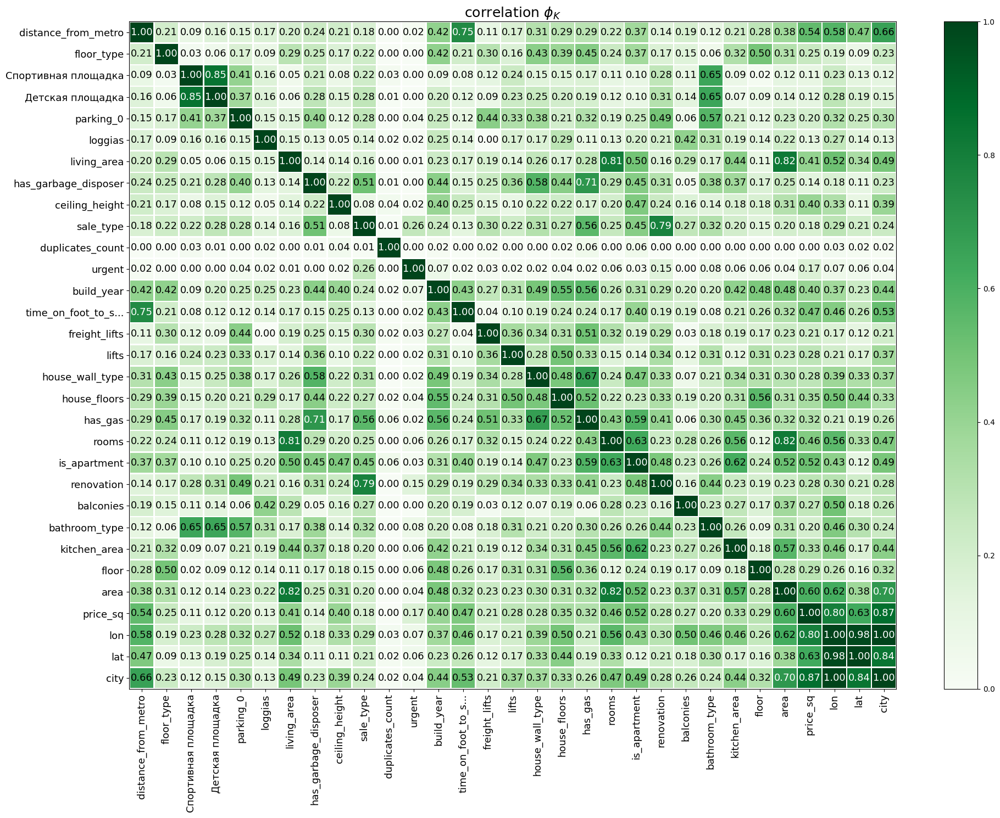

In [145]:
phik_overview = df.phik_matrix()
#phik_overview.round(2)

plot_correlation_matrix(phik_overview.values, 
                        x_labels=phik_overview.columns, 
                        y_labels=phik_overview.index, 
                        vmin=0, vmax=1, color_map="Greens", 
                        title=r"correlation $\phi_K$", 
                        fontsize_factor=1.3, 
                        figsize=(20, 15))
plt.tight_layout()

Видим, что стоимость квадратного метра коррелириует с местоположением (долгота и широта), городом, общей площадью, количеством комнат, удаленности от метро, жилой площади, типа стен дома, высоты потолков, этажности дома, годом постройки здания, площадью кухни и т.д.

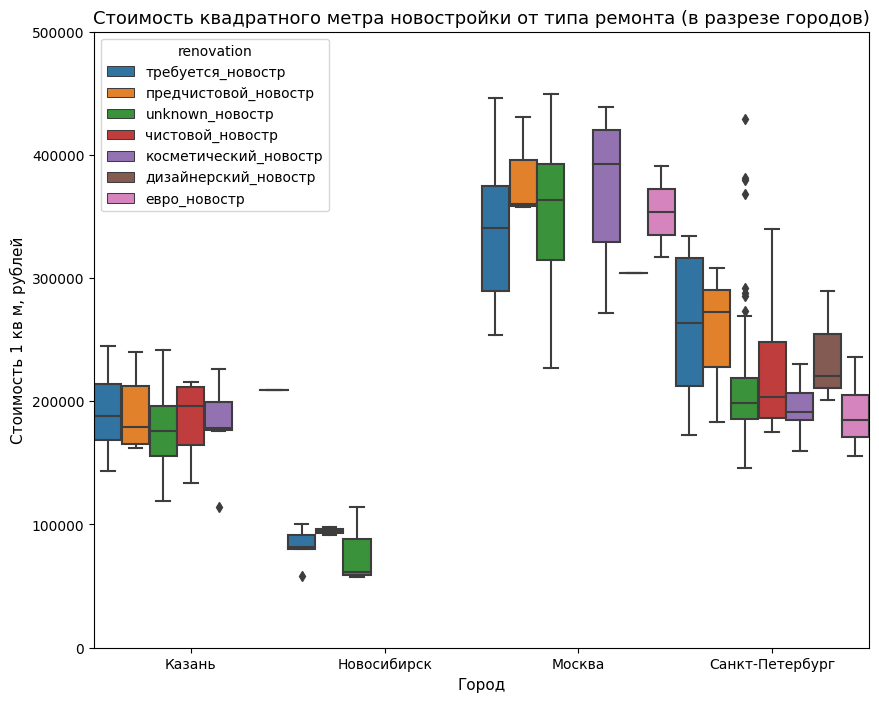

In [146]:
#построим график зависимости стоимости квадратного метра от вида ремонта в разрезе городов
cities = ['Казань','Москва','Санкт-Петербург','Новосибирск'] #'Казань','Москва','Санкт-Петербург','Новосибирск'
new_house = ['Переуступка', 'Первичная продажа'] #, 'Продажа от застройщика'
plt.figure(figsize=(10, 8))
sns.boxplot(
    y='price_sq', x='city', 
    #data = df.query('city in @cities'),
    data = df.query('city in @cities and sale_type in @new_house'),
    width= 1,
    #notch= True,
    hue='renovation')
plt.xlabel("Город", fontsize= 11)
plt.ylabel("Стоимость 1 кв м, рублей", fontsize= 11)
plt.ylim(0, 500000)
plt.title("Стоимость квадратного метра новостройки от типа ремонта (в разрезе городов)", fontsize= 13)
plt.show()

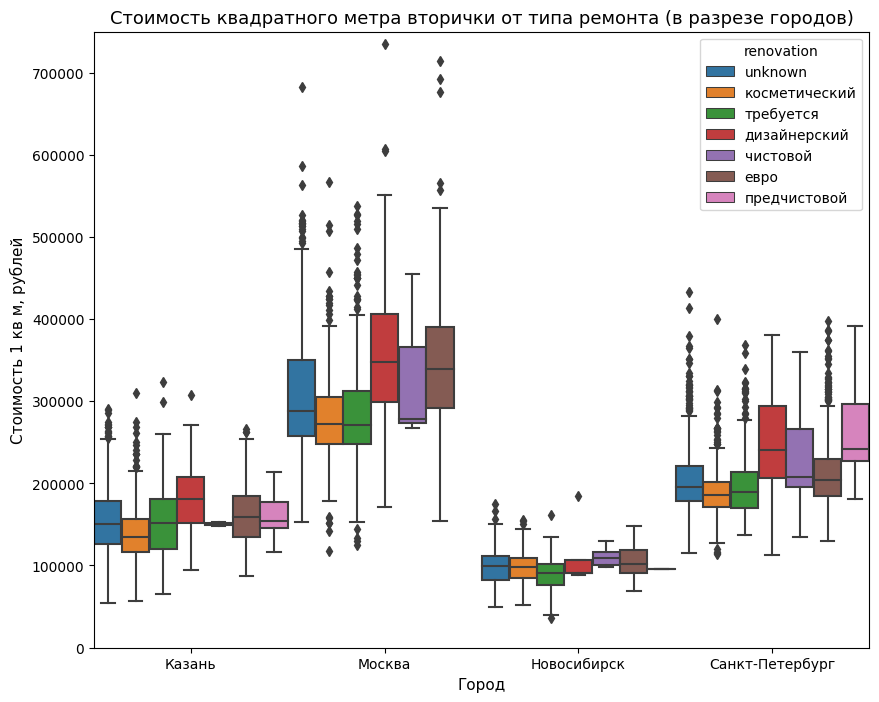

In [147]:
#построим график зависимости стоимости квадратного метра от вида ремонта в разрезе городов
cities = ['Казань','Москва','Санкт-Петербург','Новосибирск']
new_house = ['Переуступка', 'Первичная продажа']
plt.figure(figsize=(10, 8))
sns.boxplot(
    y='price_sq', x='city', 
    data = df.query('city in @cities and sale_type not in @new_house'), 
    width= 1,
    #notch= True,
    hue='renovation')
plt.xlabel("Город", fontsize= 11)
plt.ylabel("Стоимость 1 кв м, рублей", fontsize= 11)
plt.ylim(0, 750000)
plt.title("Стоимость квадратного метра вторички от типа ремонта (в разрезе городов)", fontsize= 13)
plt.show()

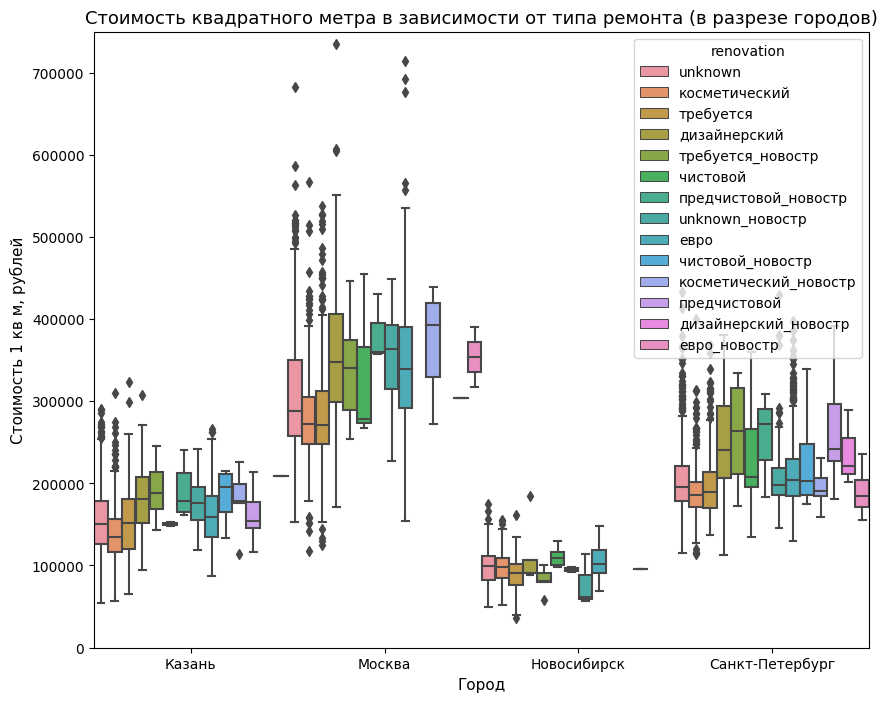

In [148]:
#построим график зависимости стоимости квадратного метра от вида ремонта в разрезе городов

plt.figure(figsize=(10, 8))
sns.boxplot(
    y='price_sq', x='city', 
    data = df.query('city in @cities'), 
    width= 1,
    #notch= True,
    hue='renovation')
plt.xlabel("Город", fontsize= 11)
plt.ylabel("Стоимость 1 кв м, рублей", fontsize= 11)
plt.ylim(0, 750000)
plt.title("Стоимость квадратного метра в зависимости от типа ремонта (в разрезе городов)", fontsize= 13)
plt.show()

<Figure size 1000x800 with 0 Axes>

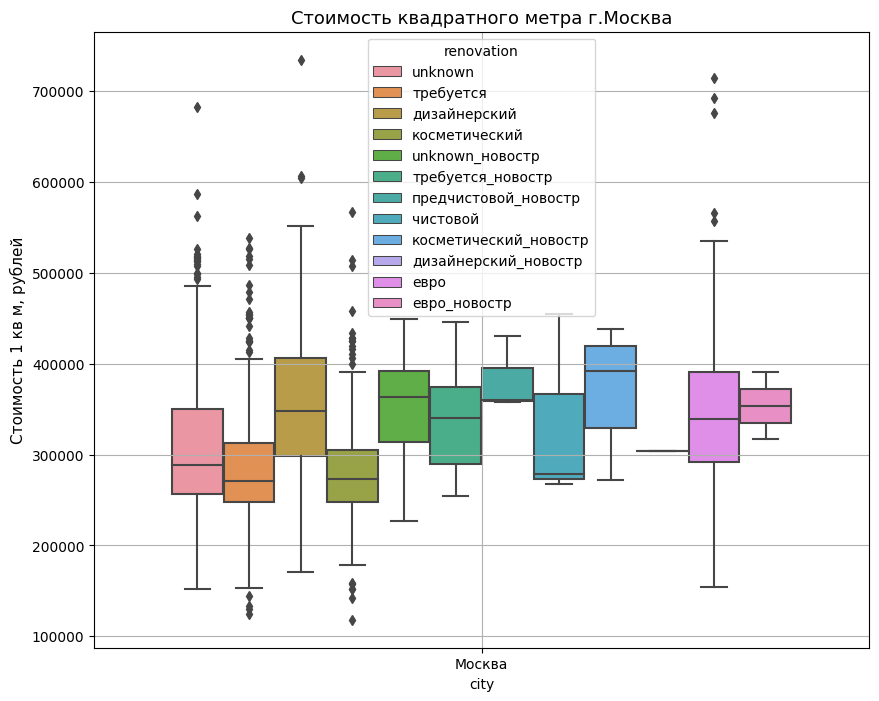

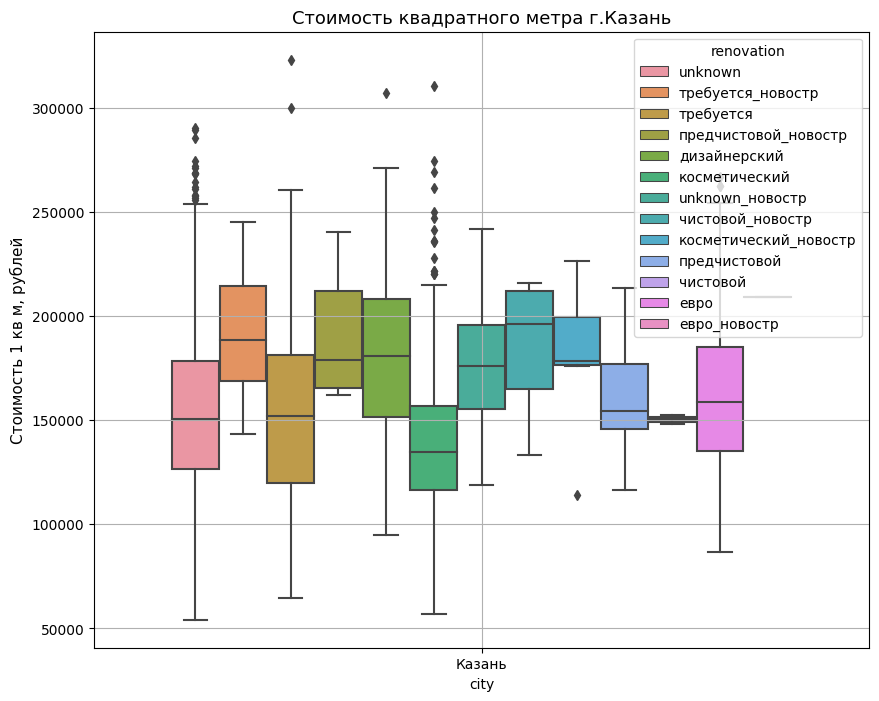

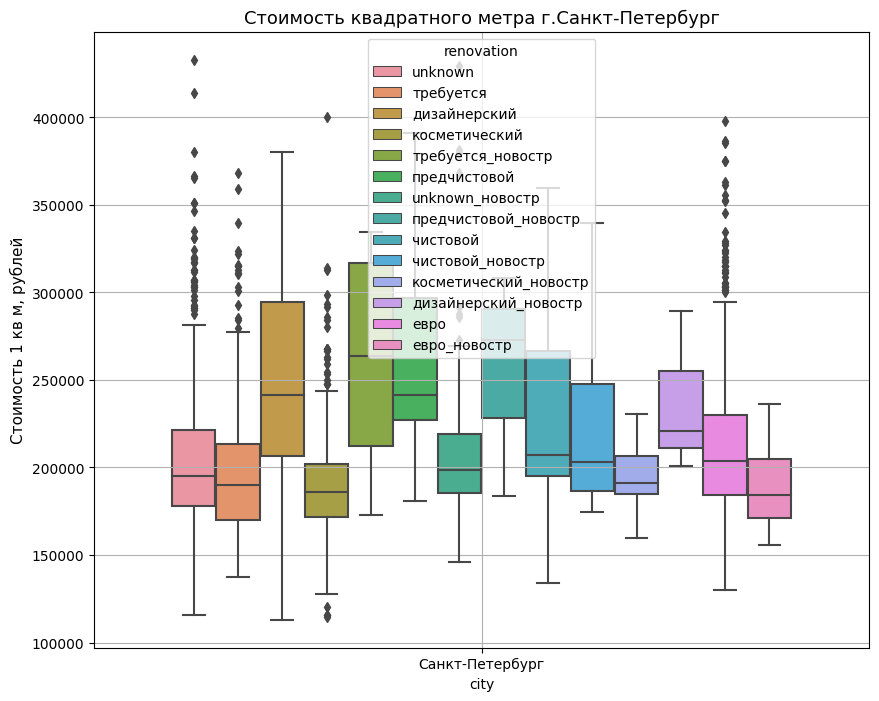

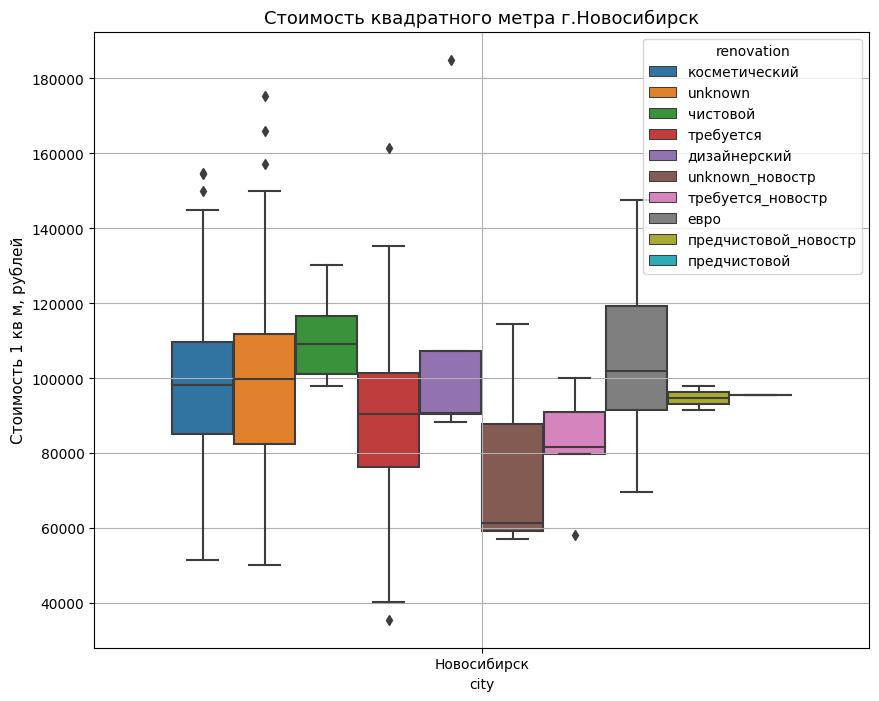

''

In [149]:
#построим график зависимости стоимости квадратного метра от вида ремонта в разрезе городов
cities = ['Москва','Казань','Санкт-Петербург','Новосибирск']
#new_house = ['Переуступка', 'Первичная продажа']
plt.figure(figsize=(10, 8))

for city in cities:
    plt.figure(figsize=(10, 8))
    box_plot = sns.boxplot(
    y='price_sq', x='city', 
    data = df.query('city == @city'), 
    width= 0.8, #palette="Set2",
    #notch= True,
    hue='renovation')

    plt.ylabel("Стоимость 1 кв м, рублей", fontsize= 11)
    #plt.ylim(0, 700000)
    plt.title("Стоимость квадратного метра г."+city, fontsize= 13)
    box_plot.grid()

    plt.show()
;

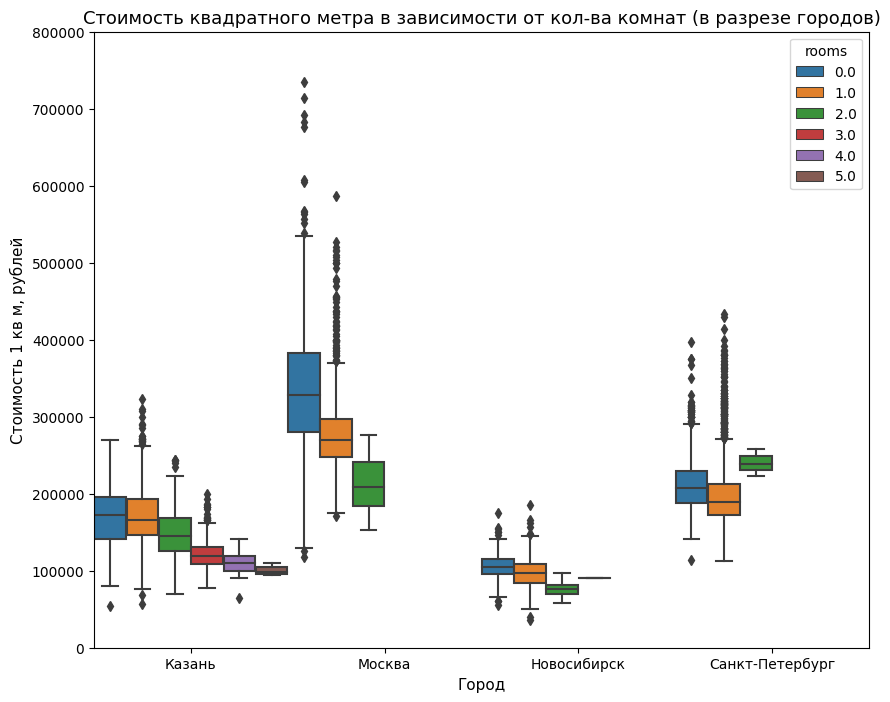

In [150]:
#построим график зависимости стоимости квадратного метра от количества комнат в разрезе городов
plt.figure(figsize=(10, 8))
sns.boxplot(
    y='price_sq', x='city', 
    data = df.query('city in @cities'), 
    width= 1,
    #notch= True,
    hue='rooms')
plt.xlabel("Город", fontsize= 11)
plt.ylabel("Стоимость 1 кв м, рублей", fontsize= 11)
plt.ylim(0, 800000)
plt.title("Стоимость квадратного метра в зависимости от кол-ва комнат (в разрезе городов)", fontsize= 13)
plt.show()

## Обучение моделей

### Выделим признаки, разделим на выборки

In [151]:
# подготовим признаки для моделей
features = df.drop(['price_sq'], axis=1)
target = df['price_sq']

In [152]:
#разобьем данные на выборки
features_train, features_test, target_train, target_test = train_test_split(features, target, 
                                                                            test_size=0.2, 
                                                                            random_state=12345) 

In [153]:
# перечислим количественные признаки
#num_features = features_train.select_dtypes(include='float64').columns.to_list() #- ['floor']
num_features = ['lat', 'lon', 'area', 'floor', 'kitchen_area', 'balconies', 
                'rooms', 'house_floors', 'build_year', 'lifts', 'freight_lifts', 
                'time_on_foot_to_subway', 'duplicates_count', 'ceiling_height', 'living_area', 'loggias','distance_from_metro',
               'Детская площадка', 'Спортивная площадка']#, 'Торговый центр', 'Парк', 'Детский сад', 'Фитнес', 'Школа']

#del num_features[6:8]
print(num_features)

# перечислим качественные признаки
#cat_features = features_train.select_dtypes(exclude=['float64']).columns.to_list() #+ ['floor']
cat_features = ['city', 'bathroom_type', 'renovation', 'is_apartment', 'has_gas', 'house_wall_type', 
                'sale_type', 'has_garbage_disposer', 'parking_0', 'floor_type'] #'yard_0', 'yard_1']
        
print(cat_features)

['lat', 'lon', 'area', 'floor', 'kitchen_area', 'balconies', 'rooms', 'house_floors', 'build_year', 'lifts', 'freight_lifts', 'time_on_foot_to_subway', 'duplicates_count', 'ceiling_height', 'living_area', 'loggias', 'distance_from_metro', 'Детская площадка', 'Спортивная площадка']
['city', 'bathroom_type', 'renovation', 'is_apartment', 'has_gas', 'house_wall_type', 'sale_type', 'has_garbage_disposer', 'parking_0', 'floor_type']


In [154]:
columns = ['name', 'MAE_train', 'R2_score_train', 'MAE_test', 'R2_score_test']
models_data = pd.DataFrame(columns=columns)

### RandomForest

In [155]:
%%time
col_transformer_rf = make_column_transformer(
    (
        #OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1), 
        OneHotEncoder(sparse=False, handle_unknown='ignore'),
        cat_features
    ),
    remainder='passthrough'
)

CPU times: total: 0 ns
Wall time: 0 ns


In [156]:
col_transformer_rf

ColumnTransformer(remainder='passthrough',
                  transformers=[('onehotencoder',
                                 OneHotEncoder(handle_unknown='ignore',
                                               sparse=False),
                                 ['city', 'bathroom_type', 'renovation',
                                  'is_apartment', 'has_gas', 'house_wall_type',
                                  'sale_type', 'has_garbage_disposer',
                                  'parking_0', 'floor_type'])])

In [157]:
%%time

model_rf = RandomForestRegressor(random_state=12345)

pipe_rf = make_pipeline(col_transformer_rf, model_rf)

param_grid_rf = {
    'randomforestregressor__n_estimators': [100, 300, 500], #range(10, 251, 10), 
    'randomforestregressor__max_depth': [5, 7, 10], #range(2, 5),
    'randomforestregressor__min_samples_split': [1, 5]
}   

    #'randomforestregressor__min_samples_split': (2, 3, 4),
    #'randomforestregressor__min_samples_leaf': (1, 2, 3, 4)

# получается достаточно много комбинаций гиперпараметров при переборе
# будем использовать RandomizedSearchCV, он работает намного быстрее
gs_rf = RandomizedSearchCV(
    #model_rf,
    pipe_rf, 
    param_distributions=param_grid_rf, 
    scoring='neg_mean_absolute_error', 
    n_jobs=-1, 
    random_state=12345
)

CPU times: total: 0 ns
Wall time: 999 µs


In [158]:
%%time

gs_rf.fit(features_train, target_train)

gs_rf_best_score = gs_rf.best_score_ * -1
gs_rf_best_params = gs_rf.best_params_
print(f'лучшее значение MAE на обуч.выборке:: {gs_rf_best_score}')
print(f'лучшие гиперпараметры: {gs_rf_best_params}')

лучшее значение MAE на обуч.выборке:: 18371.625455278787
лучшие гиперпараметры: {'randomforestregressor__n_estimators': 100, 'randomforestregressor__min_samples_split': 5, 'randomforestregressor__max_depth': 10}
CPU times: total: 3.34 s
Wall time: 17.2 s


In [159]:
mae_rf = mean_absolute_error(target_train, gs_rf.predict(features_train))
mae_rf

12974.692802611022

In [160]:
r2 = r2_score(target_train, gs_rf.predict(features_train))
r2

0.9525654013645086

In [161]:
mae_rf_test = mean_absolute_error(target_test, gs_rf.predict(features_test))
mae_rf_test

16768.394195696266

In [162]:
r2_test = r2_score(target_test, gs_rf.predict(features_test))
r2_test

0.9041514423777063

In [163]:
models_data.loc[len(models_data.index)] = [str(gs_rf.best_estimator_[1]), mae_rf, r2, mae_rf_test, r2_test]
models_data

,name,MAE_train,R2_score_train,MAE_test,R2_score_test
0,"RandomForestRegressor(max_depth=10, min_sample...",12974.692803,0.952565,16768.394196,0.904151


### CatBoostRegressor

In [164]:
train_pool = Pool(features_train, target_train, cat_features=cat_features)
test_pool = Pool(features_test, target_test, cat_features=cat_features)

In [165]:
'''
%%time
# без гридсерч и кросс-валидации
model_cat_ = CatBoostRegressor(iterations=500, depth=10, learning_rate=0.01, loss_function='MAE', silent=False)
model_cat_.fit(train_pool, eval_set=test_pool)

print('catb train mae: %g' % (mean_absolute_error(target_train, model_cat_.predict(train_pool))))
#test_score = (mean_squared_error(target_test, model_cat.predict(test_pool)))**0.5
#print('catb test rmse: %g' % test_score)
'''

"\n%%time\n# без гридсерч и кросс-валидации\nmodel_cat_ = CatBoostRegressor(iterations=500, depth=10, learning_rate=0.01, loss_function='MAE', silent=False)\nmodel_cat_.fit(train_pool, eval_set=test_pool)\n\nprint('catb train mae: %g' % (mean_absolute_error(target_train, model_cat_.predict(train_pool))))\n#test_score = (mean_squared_error(target_test, model_cat.predict(test_pool)))**0.5\n#print('catb test rmse: %g' % test_score)\n"

r2_score(target_train, model_cat_.predict(train_pool))

In [166]:
%%time
catboost = CatBoostRegressor(loss_function='MAE', logging_level='Silent')

parameters_cat = {'depth': [5, 7, 10], 
                  'learning_rate': [0.05], #np.arange(0.05,0.5, 0.15),
                  'iterations': [100, 300, 500]} #np.arange(0.1,1,0.2)

catboost_grid = catboost.grid_search(parameters_cat,
            train_pool,
            cv=4,
            verbose=100,
            plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 24687.9149160	best: 24687.9149160 (0)	total: 2.45s	remaining: 19.6s
8:	loss: 18847.4622146	best: 18449.7621083 (5)	total: 1m 48s	remaining: 0us
Estimating final quality...
CPU times: total: 11min 24s
Wall time: 3min 20s


In [167]:
catboost_grid["params"]

{'depth': 7, 'iterations': 500, 'learning_rate': 0.05}

In [168]:
%%time
final_cat = CatBoostRegressor(depth=catboost_grid["params"]["depth"], 
                              learning_rate=catboost_grid["params"]['learning_rate'],
                              iterations=catboost_grid["params"]['iterations'],
                              loss_function='MAE', verbose=100)

final_cat.fit(train_pool)

0:	learn: 59431.3996109	total: 35.5ms	remaining: 17.7s
100:	learn: 20394.4137040	total: 3.74s	remaining: 14.8s
200:	learn: 17620.9869541	total: 7.39s	remaining: 11s
300:	learn: 15422.9125787	total: 11.1s	remaining: 7.33s
400:	learn: 14290.0717025	total: 14.8s	remaining: 3.65s
499:	learn: 13398.8100422	total: 18.6s	remaining: 0us
CPU times: total: 58.9 s
Wall time: 18.7 s


0:	learn: 60173.1857470	total: 62.1ms	remaining: 31s
100:	learn: 16878.8467269	total: 6.15s	remaining: 24.3s
200:	learn: 13126.4040663	total: 12.4s	remaining: 18.5s
300:	learn: 10467.3942362	total: 18.9s	remaining: 12.5s
400:	learn: 9159.3203563	total: 25.5s	remaining: 6.29s
499:	learn: 8254.2976668	total: 32.1s	remaining: 0us
CPU times: total: 2min 24s
Wall time: 32.2 s

0:	learn: 60117.7436869	total: 66.6ms	remaining: 33.3s
100:	learn: 17604.8272220	total: 6.62s	remaining: 26.1s
200:	learn: 13676.7102945	total: 13.3s	remaining: 19.8s
300:	learn: 11046.7867914	total: 20.2s	remaining: 13.3s
400:	learn: 9620.2632730	total: 27.2s	remaining: 6.72s
499:	learn: 8644.6563030	total: 34.3s	remaining: 0us
CPU times: total: 2min 58s
Wall time: 34.4 s

In [169]:
mae_catb = mean_absolute_error(target_train, final_cat.predict(train_pool))
print('catb train mae: %g' % mae_catb)

catb train mae: 13996.6


catb train mae: 10260.4

catb train mae: 10255.1

catb train mae: 10369.5

In [170]:
r2 = r2_score(target_train, final_cat.predict(train_pool))
r2

0.9231191073948575

In [171]:
mae_catb_test = mean_absolute_error(target_test, final_cat.predict(test_pool))
print('catb test mae: %g' % (mean_absolute_error(target_test, final_cat.predict(test_pool))))

catb test mae: 16998.3


In [172]:
r2_test = r2_score(target_test, final_cat.predict(test_pool))
r2_test

0.891082773230517

In [173]:
models_data.loc[len(models_data.index)] = [final_cat, mae_catb, r2, mae_catb_test, r2_test]
models_data

,name,MAE_train,R2_score_train,MAE_test,R2_score_test
0,"RandomForestRegressor(max_depth=10, min_sample...",12974.692803,0.952565,16768.394196,0.904151
1,<catboost.core.CatBoostRegressor object at 0x0...,13996.594746,0.923119,16998.348431,0.891083


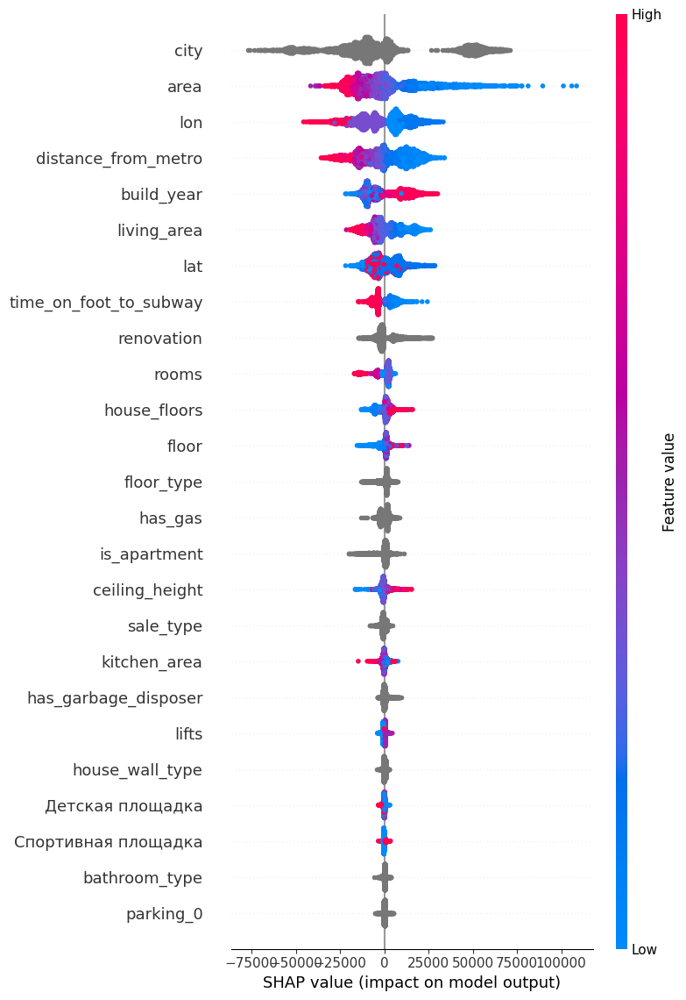

In [174]:
import shap
shap.initjs()
shap_test = shap.TreeExplainer(final_cat).shap_values(features)
shap.summary_plot(shap_test, features,
                      max_display=25, auto_size_plot=True)

### LightGBM

In [175]:
features_train_lgb = features_train.copy().astype({"city":'category',
                                  "bathroom_type":'category',
                                  "renovation":'category',
                                  "is_apartment":'category',
                                  "has_gas":'category',
                                  "house_wall_type":'category',                 
                                  "sale_type":'category',
                                  "has_garbage_disposer":'category',
                                  "parking_0":'category',
                                  "floor_type":'category'})
features_test_lgb = features_test.copy().astype({"city":'category',
                                  "bathroom_type":'category',
                                  "renovation":'category',
                                  "is_apartment":'category',
                                  "has_gas":'category',
                                  "house_wall_type":'category',               
                                  "sale_type":'category',
                                  "has_garbage_disposer":'category',
                                  "parking_0":'category',
                                  "floor_type":'category'})

In [176]:
def lgb_regr(features, target):
    model = LGBMRegressor()
    params = {
        'boosting_type' : ['gbdt'],
        'n_estimators' : [100, 300, 500],
        'max_depth' : [5, 7, 10],
        'verbose' : [-1],
        'random_state' : [12345],
        'force_col_wise': [True],
        'num_leaves' : [127]}
    grid_cv = GridSearchCV(estimator=model, param_grid=params, cv=3, n_jobs=-1, scoring='neg_mean_absolute_error')
    grid_cv.fit(features, target, categorical_feature=cat_features)
    print('Best hyperparams: ', grid_cv.best_params_)
    print('MAE score on train sample: {:.2f}'.format(-grid_cv.best_score_))
    return grid_cv.best_params_

In [177]:
%%time
lgb_params = lgb_regr(features_train_lgb, target_train)

Best hyperparams:  {'boosting_type': 'gbdt', 'force_col_wise': True, 'max_depth': 10, 'n_estimators': 500, 'num_leaves': 127, 'random_state': 12345, 'verbose': -1}
MAE score on train sample: 17011.75
CPU times: total: 6.14 s
Wall time: 2.75 s


In [178]:
%%time
model_lgb = LGBMRegressor(**lgb_params)

model_lgb.fit(features_train_lgb, target_train)

CPU times: total: 6.31 s
Wall time: 543 ms


LGBMRegressor(force_col_wise=True, max_depth=10, n_estimators=500,
              num_leaves=127, random_state=12345, verbose=-1)

In [179]:
predict_lgb = model_lgb.predict(features_train_lgb)

mae_lgb = mean_absolute_error(target_train, predict_lgb)
mae_lgb

3249.7132057663316

3561.7824045663906

In [180]:
r2 = r2_score(target_train, predict_lgb)
r2

0.9972081125889398

In [181]:
predict_lgb_test = model_lgb.predict(features_test_lgb)

mae_lgb_test = mean_absolute_error(target_test, predict_lgb_test)
mae_lgb_test

14363.865119016133

16528.80279008849

In [182]:
r2_test = r2_score(target_test, predict_lgb_test)
r2_test

0.9285817647192598

In [183]:
'''
%%time
model_lgb = LGBMRegressor(**lgb_params)

model_lgb.fit(features_train_lgb, target_train, eval_set=(features_test_lgb, target_test), verbose=100, eval_metric='mae')

predict_lgb = model_lgb.predict(features_train_lgb)

mae_lgb = mean_absolute_error(target_train, predict_lgb)
print('Test MAE = {:.2f}'.format(mae_lgb))
'''

"\n%%time\nmodel_lgb = LGBMRegressor(**lgb_params)\n\nmodel_lgb.fit(features_train_lgb, target_train, eval_set=(features_test_lgb, target_test), verbose=100, eval_metric='mae')\n\npredict_lgb = model_lgb.predict(features_train_lgb)\n\nmae_lgb = mean_absolute_error(target_train, predict_lgb)\nprint('Test MAE = {:.2f}'.format(mae_lgb))\n"

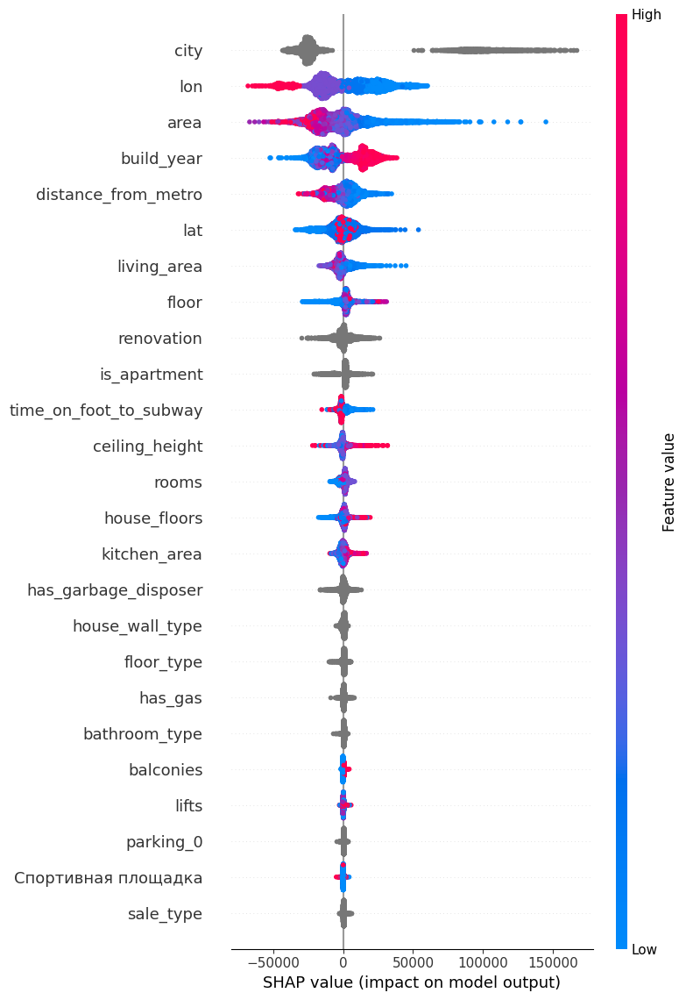

In [184]:
import shap
shap.initjs()
shap_test = shap.TreeExplainer(model_lgb).shap_values(features_train_lgb)
shap.summary_plot(shap_test, features_train_lgb,
                      max_display=25, auto_size_plot=True)

In [185]:
models_data.loc[len(models_data.index)] = [model_lgb, mae_lgb, r2, mae_lgb_test, r2_test]
models_data

,name,MAE_train,R2_score_train,MAE_test,R2_score_test
0,"RandomForestRegressor(max_depth=10, min_sample...",12974.692803,0.952565,16768.394196,0.904151
1,<catboost.core.CatBoostRegressor object at 0x0...,13996.594746,0.923119,16998.348431,0.891083
2,"LGBMRegressor(force_col_wise=True, max_depth=1...",3249.713206,0.997208,14363.865119,0.928582


## Прогноз цены для квартир из файла flats

In [186]:
features_full = pd.concat([features_train_lgb, features_test_lgb], ignore_index=True)

In [187]:
features_full = features_full.astype({"city":'category',
                                  "bathroom_type":'category',
                                  "renovation":'category',
                                  "is_apartment":'category',
                                  "has_gas":'category',
                                  "house_wall_type":'category',               
                                  "sale_type":'category',
                                  "has_garbage_disposer":'category',
                                  "parking_0":'category',
                                  "floor_type":'category'})

In [188]:
# обучим модель на всем наборе данных
model_lgb.fit(features_full, pd.concat([target_train, target_test], ignore_index=True))

LGBMRegressor(force_col_wise=True, max_depth=10, n_estimators=500,
              num_leaves=127, random_state=12345, verbose=-1)

In [189]:
features_df_flats = df_flats.copy().astype({"city":'category',
                                  "bathroom_type":'category',
                                  "renovation":'category',
                                  "is_apartment":'category',
                                  "has_gas":'category',
                                  "house_wall_type":'category',                 
                                  "sale_type":'category',
                                  "has_garbage_disposer":'category',
                                  "parking_0":'category',
                                  "floor_type":'category'})

In [190]:
predict_test = model_lgb.predict(features_df_flats)

In [191]:
df_flats['predict_price'] = predict_test

In [192]:
df_flats['primary_price'] = primary_price_sq

In [193]:
df_flats['primary_renovation'] = primary_renovation

In [194]:
df_flats.to_csv('optimum_flats_del_renov.csv', index=False)

In [195]:
df_flats.to_excel('optimum_flats_del_renov.xlsx', index=False)

In [196]:
#df_flats[df_flats['primary_renovation']=='Дизайнерский'][['city','area', 'floor', 'primary_renovation','predict_price', 'primary_price']]

In [197]:
#df_flats[df_flats['primary_renovation']=='Дизайнерский'].shape

In [198]:
#((df_flats[df_flats['primary_renovation']=='Дизайнерский']['primary_price']-df_flats[df_flats['primary_renovation']=='Дизайнерский']['predict_price'])>0).sum()

<Figure size 1000x800 with 0 Axes>

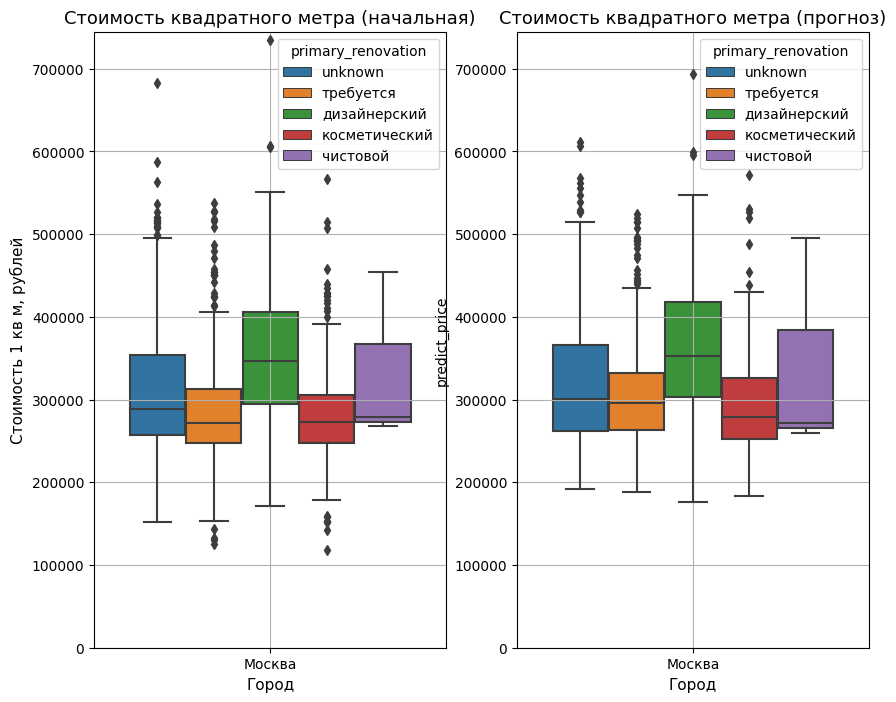

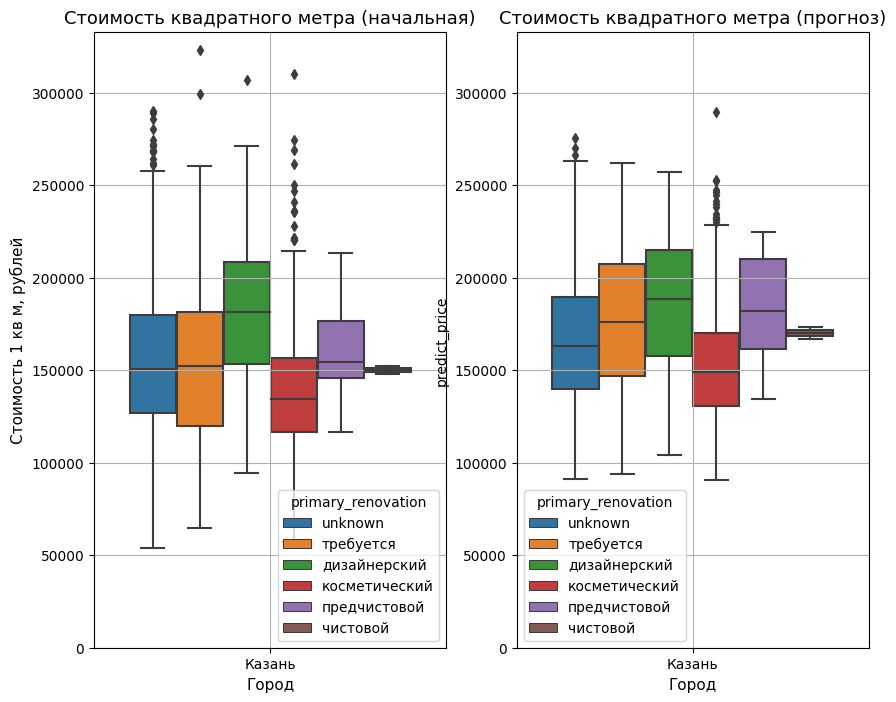

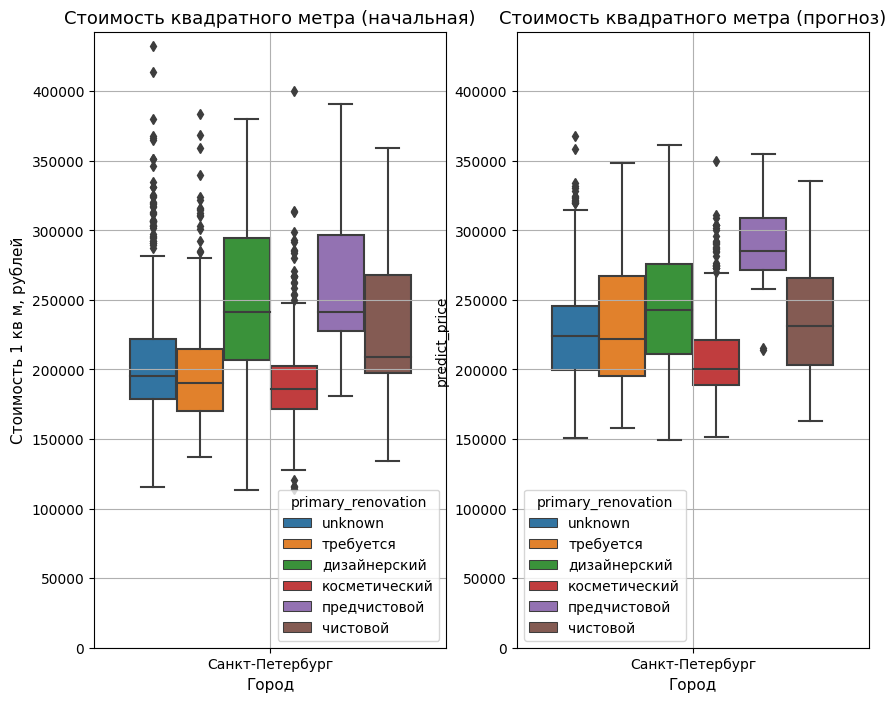

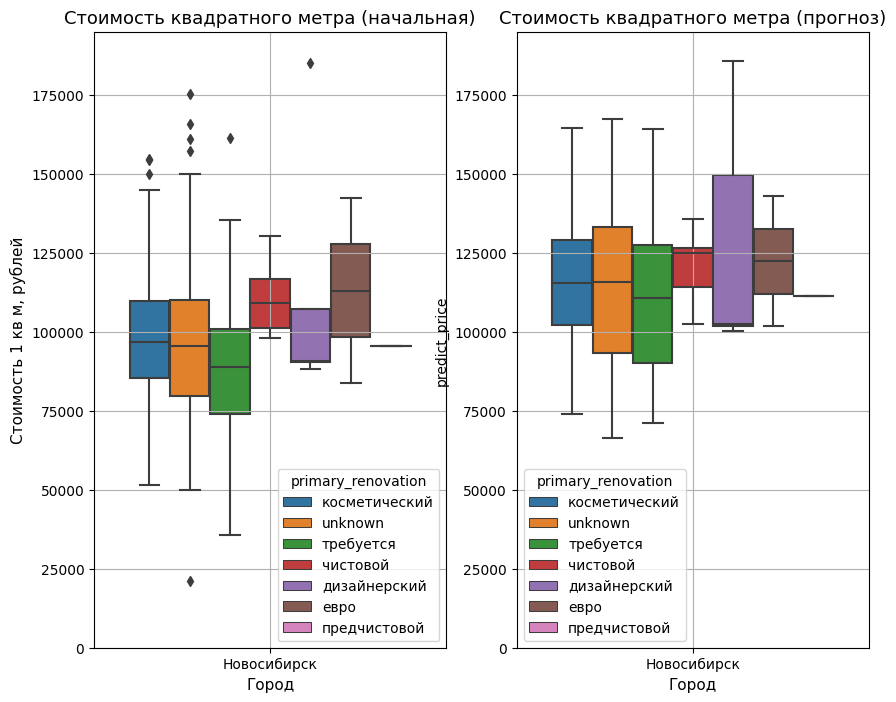

In [199]:
#построим график зависимости стоимости квадратного метра от вида ремонта (вторичка)

new_house = ['Переуступка', 'Первичная продажа']
plt.figure(figsize=(10, 8))

for city in cities:
    plt.figure(figsize=(10, 8))
    plt.subplot(1, 2, 1)
    box_plot = sns.boxplot(
    y='primary_price', x='city', 
    data = df_flats.query('city == @city and sale_type not in @new_house'), 
    width= 0.8, #palette="Set2",
    #notch= True,
    hue='primary_renovation')

    plt.xlabel("Город", fontsize= 11)
    plt.ylabel("Стоимость 1 кв м, рублей", fontsize= 11)
    plt.ylim(0, df_flats.query('city == @city and sale_type not in @new_house')['primary_price'].max()+10000)
    plt.title("Стоимость квадратного метра (начальная)", fontsize= 13)
    box_plot.grid()

    plt.subplot(1, 2, 2)
    box_plot = sns.boxplot(
    y='predict_price', x='city', 
    data = df_flats.query('city == @city and sale_type not in @new_house'), 
    width= 0.8,  #palette="Paired",
    #notch= True,
    hue='primary_renovation')

    plt.xlabel("Город", fontsize= 11)
    #plt.ylabel("Стоимость 1 кв м, рублей", fontsize= 11)
    plt.ylim(0, df_flats.query('city == @city and sale_type not in @new_house')['primary_price'].max()+10000)
    plt.title("Стоимость квадратного метра (прогноз)", fontsize= 13)
    box_plot.grid()
    plt.show()

<Figure size 1000x800 with 0 Axes>

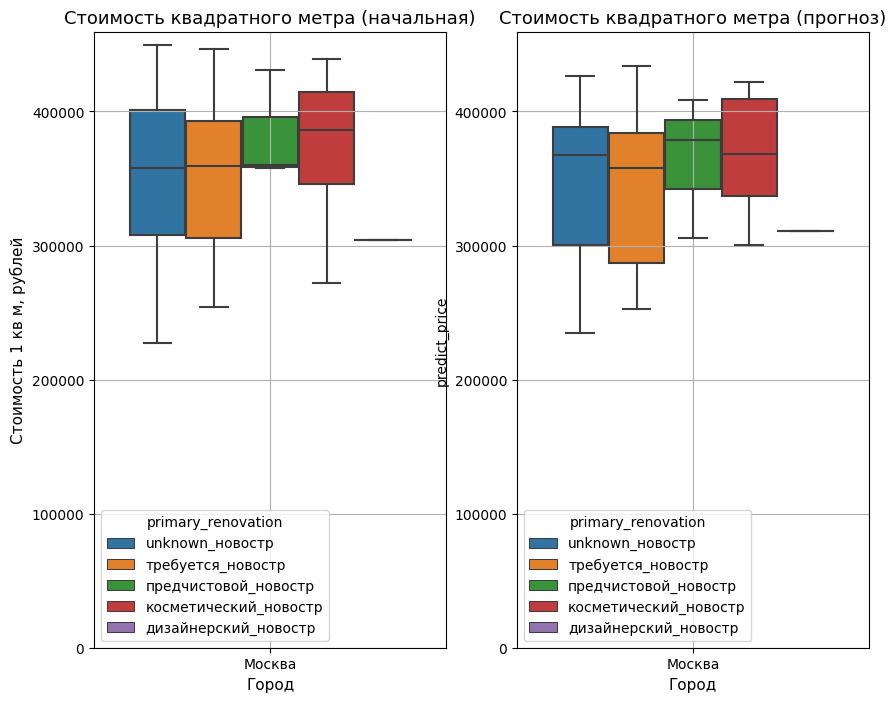

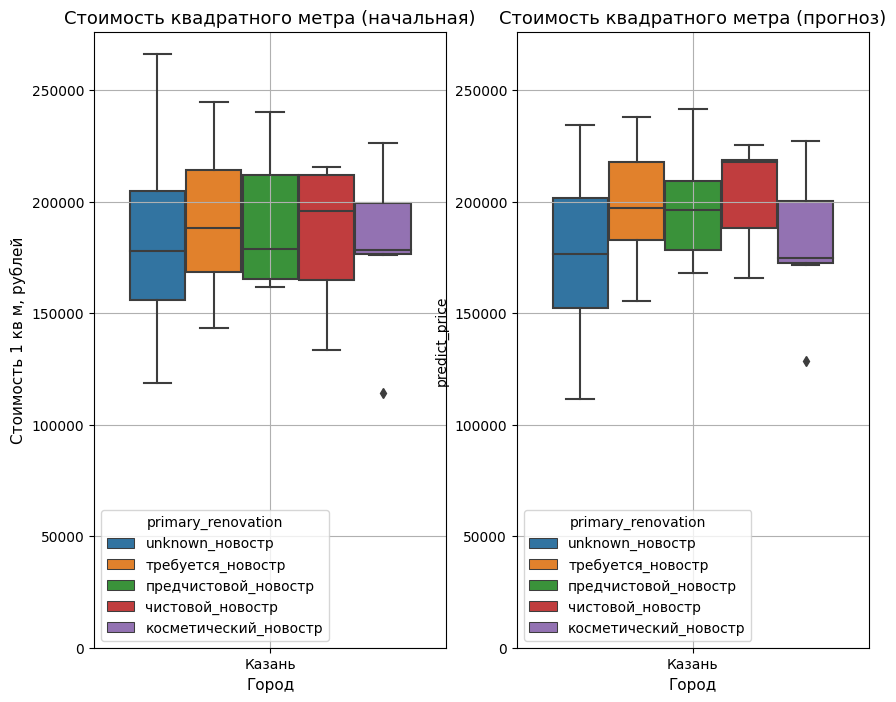

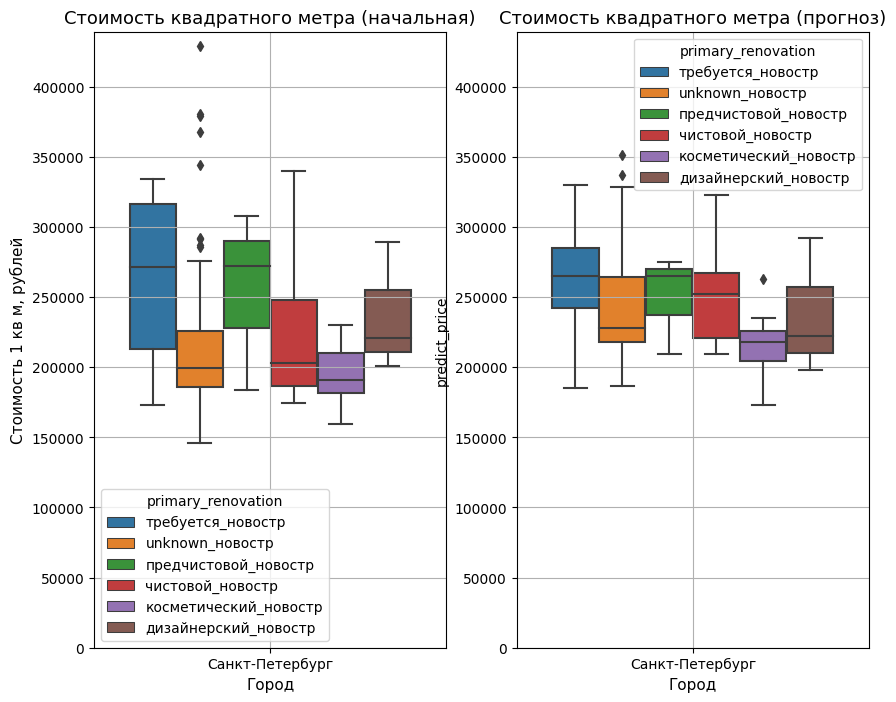

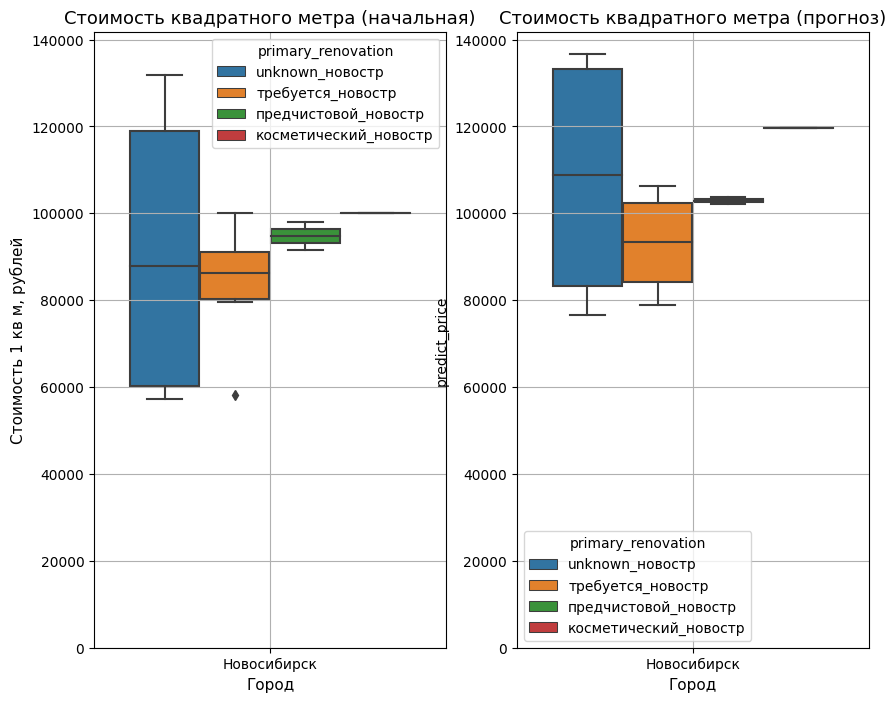

In [200]:
#построим график зависимости стоимости квадратного метра от вида ремонта (первичка)

new_house = ['Переуступка', 'Первичная продажа']
plt.figure(figsize=(10, 8))

for city in cities:
    plt.figure(figsize=(10, 8))
    plt.subplot(1, 2, 1)
    box_plot = sns.boxplot(
    y='primary_price', x='city', 
    data = df_flats.query('city == @city and sale_type in @new_house'), 
    width= 0.8, #palette="Set2",
    #notch= True,
    hue='primary_renovation')

    plt.xlabel("Город", fontsize= 11)
    plt.ylabel("Стоимость 1 кв м, рублей", fontsize= 11)
    plt.ylim(0, df_flats.query('city == @city and sale_type in @new_house')['primary_price'].max()+10000)
    plt.title("Стоимость квадратного метра (начальная)", fontsize= 13)
    box_plot.grid()

    plt.subplot(1, 2, 2)
    box_plot = sns.boxplot(
    y='predict_price', x='city', 
    data = df_flats.query('city == @city and sale_type in @new_house'), 
    width= 0.8,  #palette="Paired",
    #notch= True,
    hue='primary_renovation')

    plt.xlabel("Город", fontsize= 11)
    #plt.ylabel("Стоимость 1 кв м, рублей", fontsize= 11)
    plt.ylim(0, df_flats.query('city == @city and sale_type in @new_house')['primary_price'].max()+10000)
    plt.title("Стоимость квадратного метра (прогноз)", fontsize= 13)
    box_plot.grid()
    plt.show()

In [201]:
# добавим столбец с предсказанием в файл xlsx
workbook = openpyxl.load_workbook('flats.xlsx')

sheet = workbook['Квартиры без евроремонта']

for i, value in enumerate(list(predict_test)):
    sheet.cell(row=i+3, column=38).value = value

workbook.save('flats_euro.xlsx')

## Отчет

**Коротко о концепции:** было решено объединить данные по квартирам из файлов flats и euro_renovation в один общий датасет и обучить модель предсказывать стоимость квадратного метра для всех типов ремонта. А уже после этого заменить в файле flats столбец с типом ремонта на евро и спрогнозировать стоимость квадратного метра недвижимости для этих "обновленных" квартир из файла flats.

**Теперь подробнее**

Разработка модели для прогнозирования стоимости квартиры с учетом параметров квартиры и выполнения евроремонта проходила в несколько этапов:

- подготовка данных
- исследовательский анализ данных
- построение и обучение модели

На этапе подготовки были загружены данные из файлов xlsx и объединены в один общий датасет. Т.к. загрузка занимает довольно продолжительное время, сразу сохранили файлы в формате csv в рабочую папку. 

Затем мы ознакомились с данными, для удобства переименовали столбцы. Выяснили, что в данных большое количество пропусков. В некоторых столбцах их процент превышает 80% от общего количества записей. Избавление от пропусков и устранение неявных дублей - важный и трудоемкий этап предварительной обработки данных. 

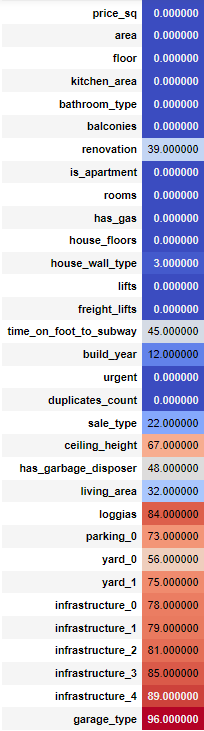

В ходе проведения исследования данных было выяснено, что в датасете встречаются квартиры, продающиеся в одном и том же доме. Это оказалось ценным наблюдением и позволило заполнить недостающие характеристики домов реальными, несинтетическими данными.  

В результате были обработаны следующие колонки: 'price_sq', 'renovation', 'house_wall_type',  'time_on_foot_to_subway', 'sale_type', 'parking_0', 'build_year', 'has_garbage_disposer', 'duplicates_count', 'ceiling_height', 'living_area', 'loggias', 'yard_0', 'yard_1'. Некоторые колонки не несли ценной информации, поэтому их просто удалили (id, infrastructure, offer_views). Был добавлен новый признак - тип этажа (первый, последний, средний). 

После того, как данные были подготовлены, мы провели анализ стоимости квартир в зависимости от разных параметров (город, количество комнат, тип ремонта, тип продажи). Результаты получились интересные, а графики - занятные и наглядные. Одно из наблюдений: типы ремонта в зависимости от типа продажи (первичка, вторичка) по разному влияют на цену квартиры. Этот момент учли, введя дополнительные типы ремонта для новостроек. Второй момент: квартиры с дизайнерским ремонтом, как правило, стоят дороже, чем с евроремонтом. То есть для квартир с дизайнерским ремонтом модель может предсказать более низкую стоимость, если изменить тип ремонта на евро.

Далее непосредственно перешли к этапу подготовки моделей. 

В качестве моделей машинного обучения были выбраны бустинговые модели CatBoostRegressor и LGBMRegressor. Выбор пал на них по ряду причин. 
- Во-первых, они отличаются высокой точностью предсказаний и позволяют довольно быстро обрабатывать большие объемы информации. 
- Во-вторых, они обладают устойчивостью к выбросам и шуму в данных. 
- И, в-третьих, они умеют использовать категориальные признаки без их предварительного кодирования.

Дополнительно была рассмотрена ансамблевая модель RandomForest.

Метрикой качества выбрали MAE (средняя абсолютная ошибка) и R2 (коэффициент детерминации). Эти метрики являются стандартными и широко используются в машинном обучении. MAE показывает среднее значение абсолютных ошибок модели, то есть насколько сильно модель ошибается в своих прогнозах, легко интерпретируема. R2 показывает, насколько хорошо модель соответствует данным (она измеряет долю дисперсии зависимой переменной, которая объясняется моделью). 

Наилучший результат показала модель LGBMRegressor. Её разультат MAE на тренировочной выборке 3249.7132057663316, на тестовой 14363.865119016133. R2 0.9972081125889398 и 0.9285817647192598 соответственно. Валидационную выборку не применяли, т.к. пользовались инструментом grid search с кроссвалидацией. 

Итак, какие выводы можем сделать из полученных резльтатов:
- наличие евроремонта положительно (увеличивает цену) сказывается для вторички для категорий ремонта "требуется" и "косметический" (Москва)
- наличие евроремонта положительно (увеличивает цену) сказывается для вторички для категорий ремонта "требуется", "косметический" и "предчистовой" (Казань, СПб)
- наличие евроремонта положительно (увеличивает цену) сказывается для вторички для категорий ремонта "требуется", "косметический", "дизайнерский" (Новосибирск) 
- во всех городах, кроме Новосибирска, квартиры с дизайнерским ремонтом после нового евроремонта рискуют подешеветь, т.е. дизайнерский ремонт стоит дороже евроремонта
- для первичного рынка ситуация особенная: цены на новостройки сами по себе довольно высокие и наличие евроремонта практически не оказывает влияния на цену

## Pandas Profiling Report

In [202]:
display(ProfileReport(df))

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]


medians = df_flats.query('city in @cities and sale_type not in @new_house').groupby(['primary_renovation'])['predict_price'].median()
vertical_offset = df_flats.query('city in @cities and sale_type not in @new_house')['predict_price'].median() * 0.05 # offset from median for display

for xtick in box_plot.get_xticks():
    box_plot.text(xtick,medians[xtick] + vertical_offset,medians[xtick], 
            horizontalalignment='center',size='x-small',color='w',weight='semibold')